# setup

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import seaborn as sns
import geopandas as gpd
import rioxarray
import cmcrameri.cm
import matplotlib as mpl
import cartopy.crs as ccrs
import joypy
from matplotlib.lines import Line2D
import cartopy.feature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.ticker as mticker
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import TwoSlopeNorm
import xarray as xr
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from cmcrameri import cm


In [2]:
ibge = gpd.read_file(r'Data\IBGE\BiomasBrasil.shp')
shp_cerrado = ibge[ibge.biomas == 'CERRADO']
hue_order = ['Central', 'Southern','Eastern']
ds_knn = xr.open_dataset(r'Data\knn_cerrado3.nc')
ds_knn.rio.write_crs(shp_cerrado.crs, inplace=True)
regions = gpd.read_file(r'Data\regions1.geojson')
gdf_knn = gpd.read_file('Data\gdf_knn_bet.geojson')
df_cerrado = pd.read_pickle('Data\df_cerrado_bet.pkl')
palette = sns.color_palette('cmc.batlow', 3)
gdf_inmet_clim = gpd.read_file(r'Data\Inmet\gdf_inmet_clim.geojson')
mapbiomas = pd.read_csv('Data\Mapbiomas\LUC_areas.csv', index_col=0)
gdf_knn.rename(columns={'map':'MAP'}, inplace=True)
my_proj = ccrs.PlateCarree()


# plots


c:\Users\luisg\anaconda3\envs\geo_env\lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


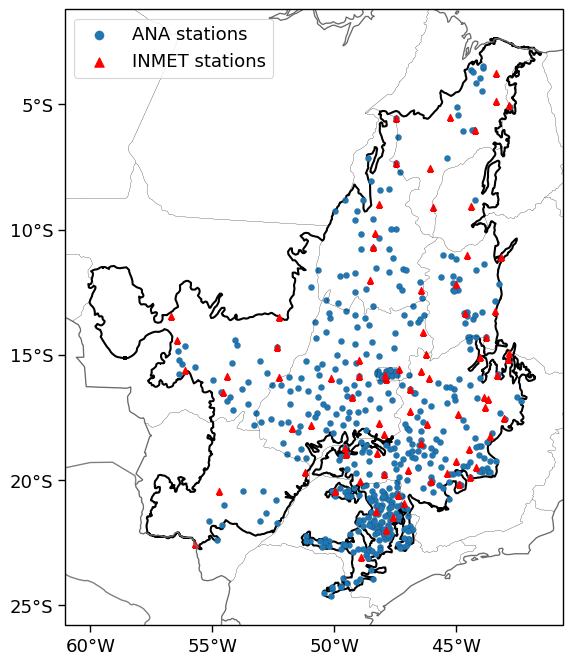

In [22]:

#plot stations
fig, ax = plt.subplots(
        figsize=[8, 8], subplot_kw={"projection": my_proj})

fs = 13
shp_cerrado.plot(ax=ax, color='white', edgecolor='black', linewidth=1.5)
gdf_knn.plot(ax=ax, marker='o', markersize=20, label='ANA stations', linewidth=0.08, edgecolor='black')
gdf_inmet_clim.plot(ax=ax, marker ="^", color='red',  markersize=20, label='INMET stations')

ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
ax.coastlines(resolution="50m", linewidth=1, color='grey')
ax.add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
ax.add_feature(cartopy.feature.STATES, linewidth=0.1)
#show latitude and longitude labels
#ax.set_xlabel('Longitude', fontsize=fs)
#ax.set_ylabel('Latitude', fontsize=fs)
## x ticks 5 by 5 degrees    
ax.set_xticks(np.arange(-60, -40, 5))
ax.set_yticks(np.arange(-25, 0, 5))

ax.tick_params(axis='both',  labelsize=fs)
#show legend
ax.legend(loc='upper left', fontsize=fs, frameon=True, markerscale=1.5)
#save figure
plt.savefig(r'Data\Plots_paper\1fig_stations.png', dpi=1200, bbox_inches='tight')

c:\Users\luisg\anaconda3\envs\geo_env\lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


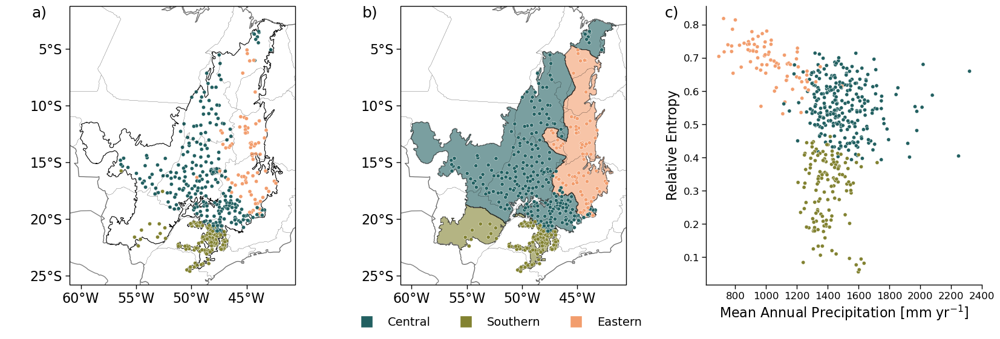

In [23]:
#fig 2, kmeans and knn
fig, ax = plt.subplots(1, 3, figsize=(20, 6), subplot_kw={"projection": my_proj})
fs = 16

shp_cerrado.plot(ax=ax[0], color='white', edgecolor='black', linewidth=0.8)
sns.scatterplot(ax=ax[0],s=20,data=gdf_knn, x='Longitude', y='Latitude', hue='cluster_kmeans', palette=palette, legend=False)
regions.plot( color=palette, edgecolor='black', linewidth=0.8, ax=ax[1], alpha=0.6)
sns.scatterplot(ax=ax[1],s=20,data=gdf_knn, x='Longitude', y='Latitude', hue='region', palette=palette, hue_order=['Central', 'Southern', 'Eastern'], alpha=1,legend=False,zorder=10)
#set the legend to the botton of the figure, horizontally centered
#ax[1].legend(loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=3, frameon=False, fontsize=14)
for axs in [ax[0], ax[1]]:
   axs.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
   axs.yaxis.set_major_formatter(LATITUDE_FORMATTER)
   axs.coastlines(resolution="50m", linewidth=1, color='grey')
   axs.add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
   axs.add_feature(cartopy.feature.STATES, linewidth=0.1)

   
   axs.set_xlabel(' ')
   axs.set_ylabel(' ')
   
   axs.set_xticks(np.arange(-60, -40, 5))
   axs.set_yticks(np.arange(-25, 0, 5))
   axs.tick_params(axis='both', labelsize=fs)
#delete ax[2] and create it again
fig.delaxes(ax[2])
ax[2] = fig.add_subplot(1, 3, 3)
sns.scatterplot(ax=ax[2],s=20,data=gdf_knn, x='MAP', y='Entropy', hue='region', palette=palette, hue_order=['Central', 'Southern', 'Eastern'],legend=False,zorder=10)

#set right labels for the axis in ax[2]
ax[2].set_xlabel('Mean Annual Precipitation [mm yr$^{-1}$]', fontsize=fs)
ax[2].set_ylabel('Relative Entropy', fontsize=fs)
ax[2].tick_params(axis='both', labelsize=12)
   
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=14),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=14),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=14)]


fig.legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.04), loc='lower center', ncol=3, frameon=False, fontsize=14)
sns.despine(ax = ax[2])
#write a), b), c) for each plot
ax[0].text(-0.1, 1, 'a)', transform=ax[0].transAxes, fontsize=18, va='top', ha='right')
ax[1].text(-0.1, 1, 'b)', transform=ax[1].transAxes, fontsize=18, va='top', ha='right')
ax[2].text(-0.1, 1, 'c)', transform=ax[2].transAxes, fontsize=18, va='top', ha='right')

plt.savefig(r'Data\Plots_paper\2fig_kmeans_knn.png', dpi=1200, bbox_inches='tight')

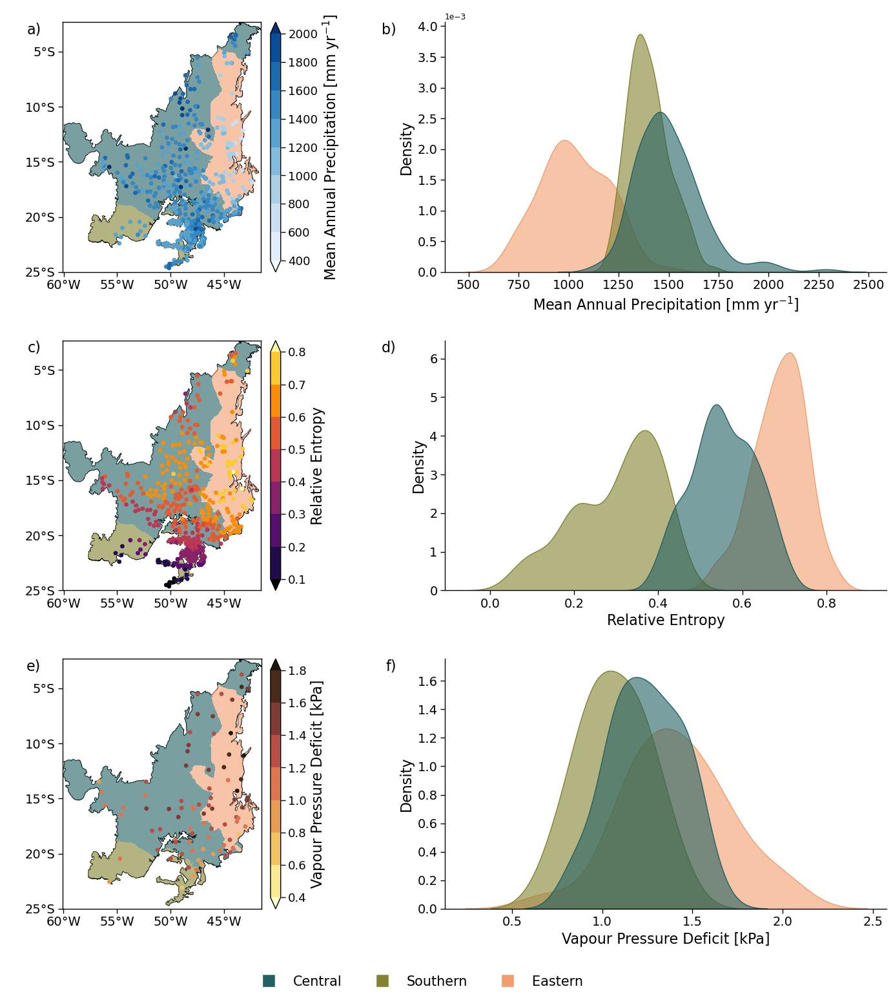

In [24]:
#plot maps and kde of metrics
metrics_plot = ['MAP', 'Entropy', 'VPD']
metrics_label = ['Mean Annual Precipitation [mm yr$^{-1}$]', 'Relative Entropy','Vapour Pressure Deficit [kPa]']
vmin = [400, 0.1, 0.4]
vmax = [2000, 0.8, 1.8]
levels = [9, 8, 8]

cmaps=[mpl.cm.Blues,mpl.cm.inferno,cm.lajolla]
fs = 16
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 

# plot map of each metric
fig, axes = plt.subplots(3,2, figsize=(15, 15))
for i, metric in enumerate(metrics_plot):    
    if i <= 1:
        dss = gdf_knn
    else:
        dss = gdf_inmet_clim
    bounds = np.linspace(vmin[i], vmax[i], levels[i])
    norm = colors.BoundaryNorm(bounds, cmaps[i].N, extend='both')
    sm = plt.cm.ScalarMappable(cmap=cmaps[i], norm=norm)
    sm._A = []
    divider = make_axes_locatable(axes[i][0])
    #create `cax` for the colorbar
    cax = divider.append_axes("right", size="5%", pad=0.1)
    shp_cerrado.plot(ax=axes[i][0], color='white', edgecolor='black', linewidth=0.8)
    ds_knn.knn.plot(ax=axes[i][0],  alpha=.6, levels=[0,1,2,3], add_colorbar=False, colors=palette)    
    dss.plot(column=metric, ax=axes[i][0],cax=cax,markersize=15, cmap=cmaps[i],
             linewidth=1, scheme="User_Defined",
             classification_kwds=dict(bins=bounds))
    fig.colorbar(sm, cax=cax, orientation='vertical', label=metrics_label[i], extend='both')
    cax.tick_params(labelsize=fs-3)
    axes[i][0].set_title(' ')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    # y ticks 5 by 5 degrees
    axes[i][0].set_yticks(np.arange(-20, 0, 5))    
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    g = sns.kdeplot(x=metric, hue='region', data=dss, ax=axes[i][1], fill=True, common_norm=False, alpha=.6, linewidth=1, palette=palette, hue_order=['Central', 'Southern', 'Eastern'], legend=False)
    
    axes[i][1].set_xlabel(metrics_label[i], fontsize=fs)
#set axes[0][1] y ticks as scientific notation
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)
    axes[i][1].tick_params(axis='both', labelsize=fs-2)
    sns.despine(ax=axes[i][1])

axes[0][1].ticklabel_format(axis='y', style='sci', scilimits=(0,0))


    
#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')


#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=15),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=15),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=15)]


fig.legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.04), loc='lower center', ncol=3, frameon=False, fontsize=15)


plt.tight_layout()
plt.savefig(r'Data\Plots_paper\3fig_metrics.png', dpi=1200, bbox_inches='tight')

## MAPBIOMAS

In [25]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes,mark_inset

map1km = xr.open_dataset(r'Data\Mapbiomas\Regions_1km_test_class.nc')
mapbiomas = pd.read_csv('Data\Mapbiomas\LUC_areas.csv', index_col=0)
map_colors = ['#D5D5E5','#006400', '#6b9932', '#b8af4f', '#45c2a5', '#ea9999']

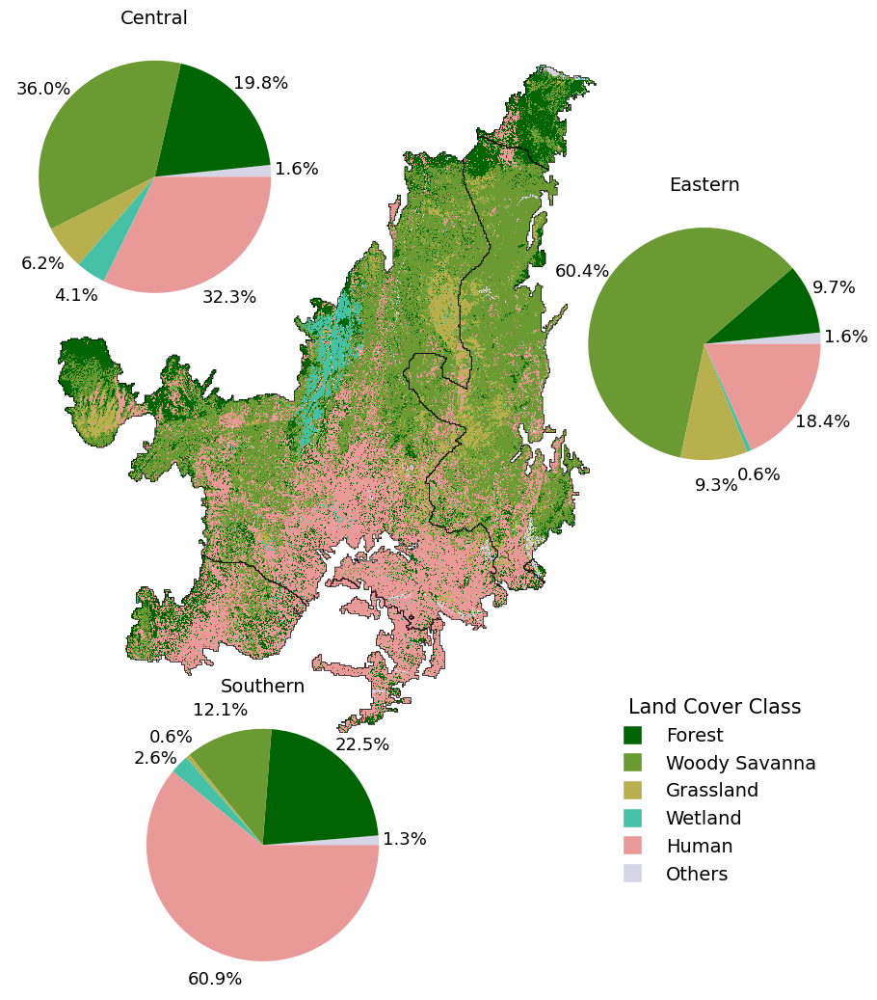

In [26]:
#now plot map10km class with each value as a color
fig, ax = plt.subplots(figsize=(9,9))
fs = 14
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":8,"axes.labelsize":fs}) 
#takeout axis from ax
ax.axis('off')
zoom = 4
#set suptile of ax a blank space
map1km['class'].where(map1km['class']>0).plot(ax=ax, colors = ['#006400', '#6b9932', '#b8af4f', '#45c2a5', '#ea9999','#D5D5E5'], levels = [100,200,300,400,500,600,700], add_colorbar = False)
ax.set_title(' ')


axins = zoomed_inset_axes(ax,zoom,loc='lower left',  bbox_to_anchor=(-0.1,0.6),bbox_transform= ax.transAxes)
axins.pie(mapbiomas['Central'].values,  autopct='%1.1f%%', pctdistance=1.22, colors=map_colors)
axins.set_title('Central', fontsize=14)

axins2 = zoomed_inset_axes(ax,zoom,loc='lower left',  bbox_to_anchor=(0.92,0.35),bbox_transform= ax.transAxes)
axins2.pie(mapbiomas['Eastern'].values,  autopct='%1.1f%%', pctdistance=1.22, colors=map_colors)
axins2.set_title('Eastern', fontsize=14)

axins3 = zoomed_inset_axes(ax,zoom,loc='lower left',  bbox_to_anchor=(0.1,-0.4),bbox_transform= ax.transAxes)
axins3.pie(mapbiomas['Southern'].values,  autopct='%1.1f%%', pctdistance=1.22, colors=map_colors ,rotatelabels=True)
axins3.set_title('Southern', fontsize=14)
axins3.texts[9].set_position((-0.92,0.75))



#ax.annotate('Central', xy=(0.5,0.5), xycoords='axes fraction', xytext=(-0.40,1.05), textcoords='axes fraction', arrowprops=dict(arrowstyle="-", color='black', lw=2, connectionstyle="angle,angleA=0,angleB=90,rad=2"))
#create legend with colorcode
#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Forest', markerfacecolor=map_colors[1], markersize=14),
                  Line2D([0], [0], marker='s', color='w', label='Woody Savanna', markerfacecolor=map_colors[2], markersize=14),
                  Line2D([0], [0], marker='s', color='w', label='Grassland', markerfacecolor=map_colors[3], markersize=14),
                  Line2D([0], [0], marker='s', color='w', label='Wetland', markerfacecolor=map_colors[4], markersize=14),
                  Line2D([0], [0], marker='s', color='w', label='Human', markerfacecolor=map_colors[5], markersize=14),
                  Line2D([0], [0], marker='s', color='w', label='Others', markerfacecolor=map_colors[0], markersize=14)
]



ax.legend(handles=legend_elements,loc='lower left',  bbox_to_anchor=(1,-0.25),bbox_transform= ax.transAxes, title='Land Cover Class', title_fontsize=15, fontsize=14, frameon=False)


regions.plot(ax=ax, facecolor="none", edgecolor='black', linewidth=0.5)
plt.savefig(r'Data\Plots_paper\4fig_mapbiomas.png', dpi=1200, bbox_inches='tight')

## trends

In [9]:
#open files of pr
df_slopes_pr = pd.read_csv(r'Data\tendency\df_slopes_pr.csv', index_col=0)
df_trends_pr = pd.read_csv(r'Data\tendency\df_trends_pr.csv', index_col=0)
gdf_mk_pr_ent = gpd.read_file(r'Data\tendency\gdf_mk_pr_ent.geojson')
#ent
df_slopes_ent = pd.read_csv(r'Data\tendency\df_slopes_ent.csv', index_col=0)
df_trends_ent = pd.read_csv(r'Data\tendency\df_trends_ent.csv', index_col=0)
#vpd
df_slopes_vpd = pd.read_csv(r'Data\tendency\df_slopes_vpd.csv', index_col=0)
df_trends_vpd = pd.read_csv(r'Data\tendency\df_trends_vpd.csv', index_col=0)
gdf_mk_vpd = gpd.read_file(r'Data\tendency\gdf_mk_vpd.geojson')

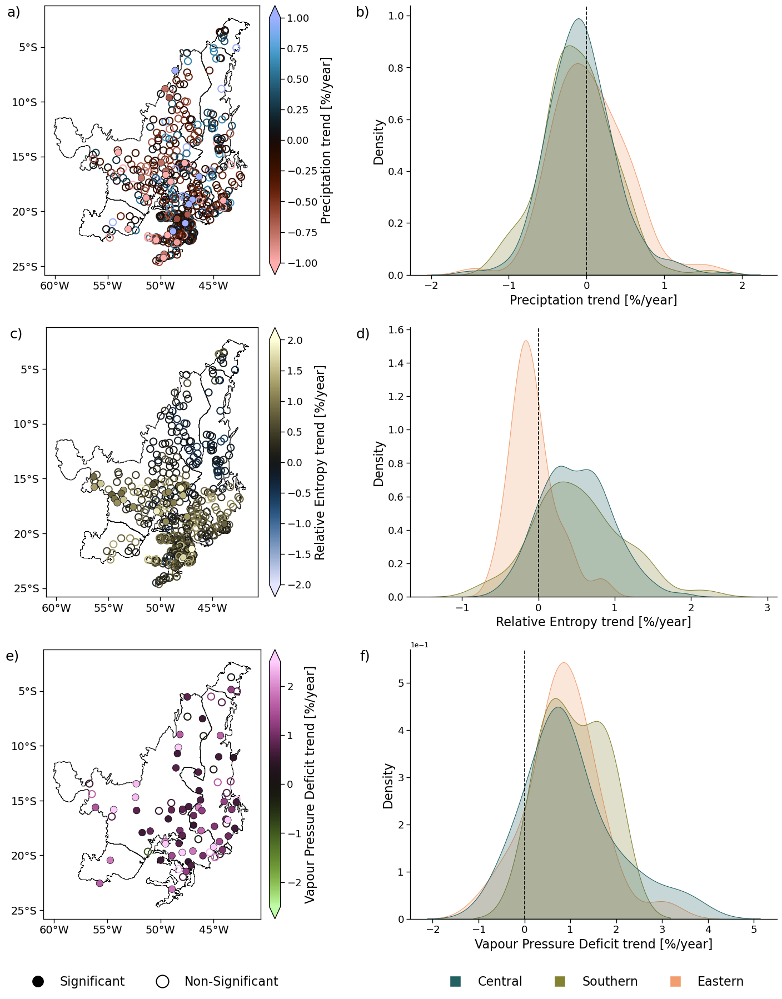

In [12]:
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

ms = 80
fs= 16
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 
# Create a list of dataframes and colormaps for each subplot
dataframes = [gdf_mk_pr_ent,  gdf_mk_pr_ent, gdf_mk_vpd]
colormaps = [cm.berlin_r, cm.lisbon, cm.vanimo_r]
p_values = ['p_anual', 'p_ent', 'p_anual']
varr = ['pr_ratio_anual', 'ent_ratio', 'VPD_ratio_anual']
norm_values = [(-1, 1), (-2, 2), (-2.5, 2.5)]
data_labels = ["Preciptation trend [%/year]", "Relative Entropy trend [%/year]","Vapour Pressure Deficit trend [%/year]"]
for i in range(3):
        df = dataframes[i]
        cmap = colormaps[i]
        norm = mpl.colors.Normalize(vmin=norm_values[i][0], vmax=norm_values[i][1])
        sm = plt.cm.ScalarMappable(cmap=colormaps[i], norm=norm)
        sm._A = []
        divider = make_axes_locatable(axes[i][0])
        #create `cax` for the colorbar
        cax = divider.append_axes("right", size="5%", pad=0.1)
        # Plot regions for all plots in the first column
        regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.8)
        axes[i][1].axvline(x=0, color='black', linestyle='--')
        sns.despine(ax=axes[i][1])
        axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
        axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
        axes[i][0].set_xlabel('')
        axes[i][0].set_ylabel('')
        axes[i][0].set_xticks(np.arange(-60, -40, 5))
        axes[i][0].set_yticks(np.arange(-25, 0, 5))
        axes[i][0].tick_params(axis='both', labelsize=fs - 2)
        axes[i][1].tick_params(axis='both', labelsize=fs - 3)



        im = df[df[p_values[i]] > 0.05].plot(edgecolor=cmap(norm(df[varr[i]].values)),
                                                       ax=axes[i][0], markersize=ms, linewidth=1.5, marker='o',
                                                       color='none')
        df[df[p_values[i]] <= 0.05].plot(column=varr[i], ax=axes[i][0], cmap=cmap,
                                                         markersize=ms, edgecolor='black', linewidth=0.5, marker='o',
                                                         legend=False, vmax=norm_values[i][1],
                                                         vmin=norm_values[i][0],
                                                         legend_kwds={'label': data_labels[i]})

        sns.kdeplot(df, legend=False, hue='region', x=varr[i], fill=True, palette=palette,
                        hue_order=hue_order, ax=axes[i][1], common_norm=False)
        axes[i][1].set_xlabel(data_labels[i])
        #set axes[i][1] y ticks as scientific notation
        axes[i][1].ticklabel_format(axis='y', style='sci', scilimits=(0,0))
        fig.colorbar(sm, cax=cax, orientation='vertical', label=data_labels[i], extend='both')
        cax.tick_params(labelsize=fs-3)

#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=18, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=18, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=18, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=18, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=18, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=18, va='top', ha='right')


#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=14),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=14),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=14)]



#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[2][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=16),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=16, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=16)

axes[2][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=16)


plt.tight_layout()
#plt.savefig(r'Data\Plots_paper\5fig_trends.png', dpi=1200, bbox_inches='tight')

## cmip

In [29]:
#open files
ds_ssp245_pr_anomaly = xr.open_dataset(r'Data\CMIP6\plots\pr_ssp245_anomaly.nc')
ds_ssp585_pr_anomaly = xr.open_dataset(r'Data\CMIP6\plots\pr_ssp585_anomaly.nc')
ds_ssp245_vpd_anomaly = xr.open_dataset(r'Data\CMIP6\plots\vpd_ssp245_anomaly.nc')
ds_ssp585_vpd_anomaly = xr.open_dataset(r'Data\CMIP6\plots\vpd_ssp585_anomaly.nc')
ds_ssp245_ent_anomaly = xr.open_dataset(r'Data\CMIP6\plots\ent_ssp245_anomaly.nc')
ds_ssp585_ent_anomaly = xr.open_dataset(r'Data\CMIP6\plots\ent_ssp585_anomaly.nc')
#set variables attributes
ds_ssp245_vpd_anomaly.vpd.attrs['units'] = 'kPa'
ds_ssp245_vpd_anomaly.vpd.attrs['long_name'] = 'Vapour Pressure Deficit Anomaly'
ds_ssp585_vpd_anomaly.vpd.attrs['units'] = 'kPa'
ds_ssp585_vpd_anomaly.vpd.attrs['long_name'] = 'Vapour Pressure Deficit Anomaly'

#ds_ssp245_ent_anomaly.entropy.attrs['units'] = ' '
ds_ssp245_ent_anomaly.entropy.attrs['long_name'] = 'Relative Entropy Anomaly'
#ds_ssp585_ent_anomaly.entropy.attrs['units'] = 'bits'
ds_ssp585_ent_anomaly.entropy.attrs['long_name'] = 'Relative Entropy Anomaly'

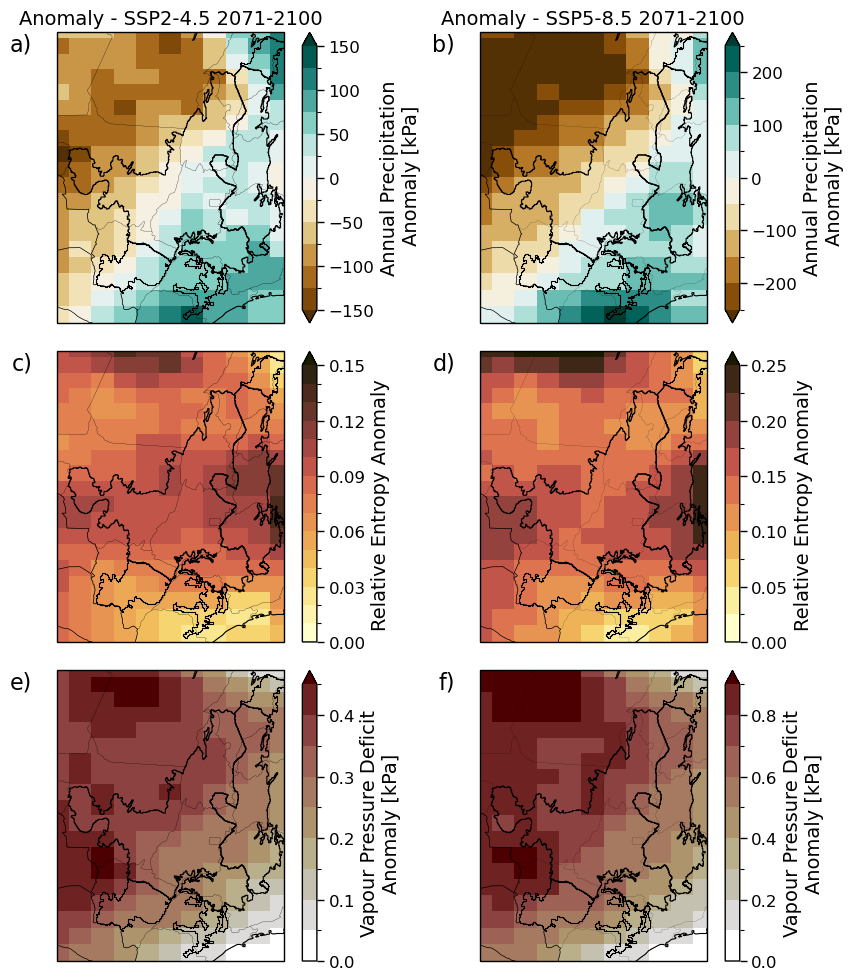

In [30]:
proj_plot = ccrs.Mercator()
fig, ax = plt.subplots(3, 2, figsize=(9, 10), subplot_kw={'projection': proj_plot})
fs= 14
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":14,"axes.labelsize":fs, 'ytick.labelsize' : 12 }) 

ds_ssp245_pr_anomaly.pr.plot(ax=ax[0][0], transform=ccrs.PlateCarree(), vmin=-150, vmax=150,levels=13, cmap='BrBG',cbar_kwargs={'ticks': np.arange(-150, 151, 50), 'label': 'Annual Precipitation\n Anomaly [kPa]'})
ds_ssp585_pr_anomaly.pr.plot(ax=ax[0][1], transform=ccrs.PlateCarree(), vmin=-250, vmax=250,levels=11, cmap='BrBG',cbar_kwargs={'ticks': np.arange(-300, 301, 100), 'label': 'Annual Precipitation\n Anomaly [kPa]'})

ds_ssp245_ent_anomaly.entropy.plot(ax=ax[1][0], transform=ccrs.PlateCarree(), cmap='cmc.lajolla', robust=True, vmin=0,levels=16, vmax=0.15,cbar_kwargs={'ticks': np.arange(0.0, 0.16, 0.03)})
ds_ssp585_ent_anomaly.entropy.plot(ax=ax[1][1], transform=ccrs.PlateCarree(), cmap='cmc.lajolla', robust=True, vmin=0, vmax=0.25,levels=11,cbar_kwargs={'ticks': np.arange(0.0, 0.31, 0.05)})
#sns.lineplot(data=df_ent, x='year', y='entropy', hue='Region', ax=ax[1][2], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False)

ds_ssp245_vpd_anomaly.vpd.plot(ax=ax[2][0], transform=ccrs.PlateCarree(),  cmap='cmc.bilbao', robust=True, vmin=0, vmax=0.45,levels=10,cbar_kwargs={'ticks': np.arange(0.0, 0.65, 0.1)})
ds_ssp585_vpd_anomaly.vpd.plot(ax=ax[2][1], transform=ccrs.PlateCarree(),  cmap='cmc.bilbao', robust=True, vmin=0, vmax=0.9,levels=10,cbar_kwargs={'ticks': np.arange(0.0, 1.21, 0.2)})
#sns.lineplot(data=df_vpd, x='year', y='vpd', hue='Region', ax=ax[2][2], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False)


for i in range(3):
    regions.plot(ax=ax[i][0], facecolor="none", edgecolor='black', linewidth=0.8,transform=ccrs.PlateCarree())
    regions.plot(ax=ax[i][1], facecolor="none", edgecolor='black', linewidth=0.8,transform=ccrs.PlateCarree())
    ax[i][0].coastlines()
    ax[i][1].coastlines()
    ax[i][0].add_feature(cartopy.feature.BORDERS, linewidth=0.5)
    ax[i][1].add_feature(cartopy.feature.BORDERS, linewidth=0.5)
    ax[i][0].add_feature(cartopy.feature.STATES, linewidth=0.1)
    ax[i][1].add_feature(cartopy.feature.STATES, linewidth=0.05)

    ax[i][0].set_extent([-61, -42, -25, -2], crs=ccrs.PlateCarree())
    ax[i][1].set_extent([-61, -42, -25, -2], crs=ccrs.PlateCarree())
             
#set axis titles
ax[0][0].set_title('Anomaly - SSP2-4.5 2071-2100')
ax[0][1].set_title('Anomaly - SSP5-8.5 2071-2100') 


#write a) b) c) on the plots
ax[0][0].text(-0.11, 1, 'a)', transform=ax[0][0].transAxes, fontsize=16, va='top', ha='right')
ax[0][1].text(-0.11, 1, 'b)', transform=ax[0][1].transAxes, fontsize=16, va='top', ha='right')
ax[1][0].text(-0.11, 1, 'c)', transform=ax[1][0].transAxes, fontsize=16, va='top', ha='right')
ax[1][1].text(-0.11, 1, 'd)', transform=ax[1][1].transAxes, fontsize=16, va='top', ha='right')
ax[2][0].text(-0.11, 1, 'e)', transform=ax[2][0].transAxes, fontsize=16, va='top', ha='right')
ax[2][1].text(-0.11, 1, 'f)', transform=ax[2][1].transAxes, fontsize=16, va='top', ha='right')

plt.tight_layout()
plt.savefig(r'Data\Plots_paper\6fig_cmip.png', dpi=1200, bbox_inches='tight')

## Vectors

### joyplots

In [3]:
import joypy
dff = pd.read_csv('Data\joyplots\df_cmip6_joy.csv')
df_vectors = pd.read_csv('Data\joyplots\df_ssp585_vectors_joy.csv')
df_vectors245 = pd.read_csv('Data\joyplots\df_ssp245_vectors_joy.csv')
df_historical_mean = pd.read_csv('Data\joyplots\df_historical_vectors_mean_joy.csv')
df_vec_mean245 = pd.read_csv('Data\joyplots\df_ssp245_vectors_mean_joy.csv')
df_vec_mean = pd.read_csv('Data\joyplots\df_ssp585_vectors_mean_joy.csv')

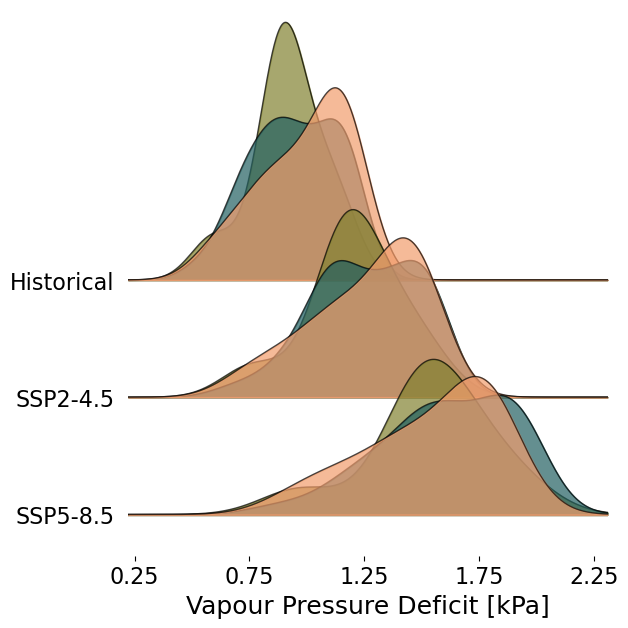

In [4]:
dff['Central'] = dff['vpd'].where(dff['Region']=='Central')
dff['Southern'] = dff['vpd'].where(dff['Region']=='Southern')
dff['Eastern' ] = dff['vpd'].where(dff['Region']=='Eastern')
fs = 18

fig, axes = joypy.joyplot(dff, by="Experiment", column=['Southern','Central','Eastern'],  figsize=(6,6), overlap=2.8, linewidth=1,  color=[palette[1],palette[0],palette[2]],  alpha=0.7)

plt.xlabel('Vapour Pressure Deficit [kPa]', fontsize=fs)
#change ticks size
plt.xticks(fontsize=fs-2)
axes[0].tick_params(axis='both', labelsize=fs-2)
axes[1].tick_params(axis='both', labelsize=fs-2)
axes[2].tick_params(axis='both', labelsize=fs-2)
#change x ticks to 0.25 to 2.25 in 0.5 intervals
plt.xticks(np.arange(0.25, 2.26, 0.5))
#plt.axvline(x=df_historical_mean.loc['Central', 'vpd'], color=palette[0], linestyle='--', linewidth=1)
#plt.axvline(x=df_historical_mean.loc['Southern','vpd'], color=palette[1], linestyle='--', linewidth=1)
#plt.axvline(x=df_historical_mean.loc['Eastern', 'vpd'], color=palette[2], linestyle='--', linewidth=1, label='1981-2010 Mean')
plt.savefig(r'Data\joyplots\vpd.png', dpi=1200, bbox_inches='tight')

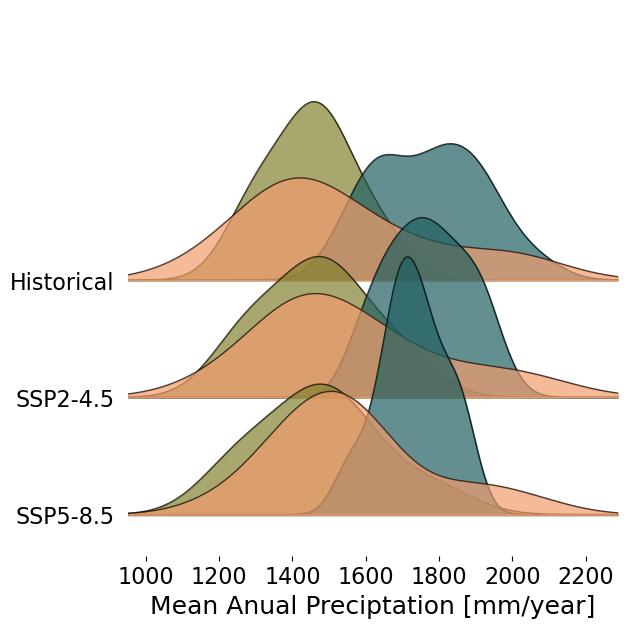

In [5]:
dff['Central' ] = dff['pr'].where(dff['Region']=='Central')
dff['Southern'] = dff['pr'].where(dff['Region']=='Southern')
dff['Eastern' ] = dff['pr'].where(dff['Region']=='Eastern')


fig, axes = joypy.joyplot(dff, by="Experiment", column=['Southern','Central','Eastern'],  figsize=(6,6), overlap=2.8, linewidth=1, color=[palette[1],palette[0],palette[2]],  alpha=0.7)

plt.xlabel('Mean Anual Preciptation [mm/year]', fontsize=fs)
#change ticks size
plt.xticks(fontsize=fs-2)
axes[0].tick_params(axis='both', labelsize=fs-2)
axes[1].tick_params(axis='both', labelsize=fs-2)
axes[2].tick_params(axis='both', labelsize=fs-2)


#plt.axvline(x=df_historical_mean.loc['Central', 'pr'], color=palette[0], linestyle='--', linewidth=1)
#plt.axvline(x=df_historical_mean.loc['Southern','pr'], color=palette[1], linestyle='--', linewidth=1)
#plt.axvline(x=df_historical_mean.loc['Eastern', 'pr'], color=palette[2], linestyle='--', linewidth=1)

plt.savefig(r'Data\joyplots\map.png', dpi=1200, bbox_inches='tight')

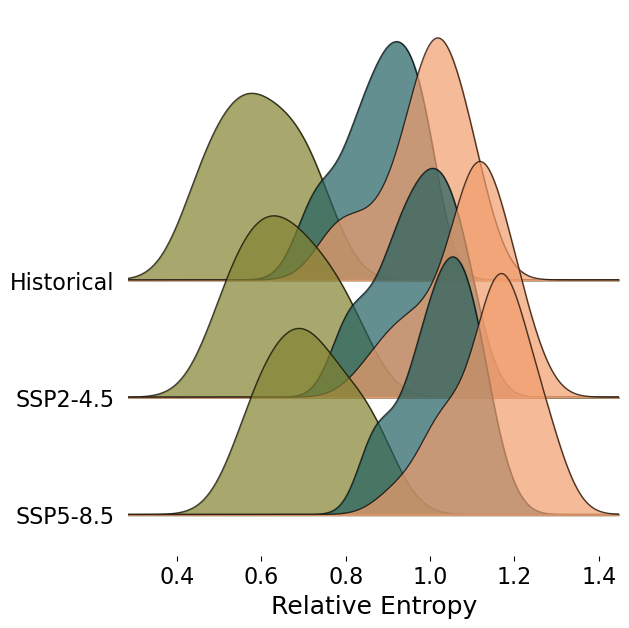

In [6]:
dff['Central' ] = dff['entropy'].where(dff['Region']=='Central')
dff['Southern'] = dff['entropy'].where(dff['Region']=='Southern')
dff['Eastern' ] = dff['entropy'].where(dff['Region']=='Eastern')


fig, axes = joypy.joyplot(dff, by="Experiment", column=['Southern','Central','Eastern'],  figsize=(6,6), overlap=2.8, linewidth=1, color=[palette[1],palette[0],palette[2]],  alpha=0.7)

plt.xlabel('Relative Entropy', fontsize=fs)
#change ticks size
plt.xticks(fontsize=fs-2)
axes[0].tick_params(axis='both', labelsize=fs-2)
axes[1].tick_params(axis='both', labelsize=fs-2)
axes[2].tick_params(axis='both', labelsize=fs-2)
#plot a vertical line at the mean of the ssp585 period
#plt.axvline(x=df_ssp585.groupby('Region').mean().loc['Central', 'entropy'], color=palette[0], linestyle='-', linewidth=1)
#plt.axvline(x=df_ssp585.groupby('Region').mean().loc['Southern', 'entropy'], color=palette[1], linestyle='-', linewidth=1)
#plt.axvline(x=df_ssp585.groupby('Region').mean().loc['Eastern', 'entropy'], color=palette[2], linestyle='-', linewidth=1)

plt.savefig(r'Data\joyplots\entropy.png', dpi=1200, bbox_inches='tight')

In [7]:
from PIL import Image
img_ent = Image.open(r'Data\joyplots\entropy.png')
img_map = Image.open(r'Data\joyplots\map.png')
img_vpd = Image.open(r'Data\joyplots\vpd.png')

### vector

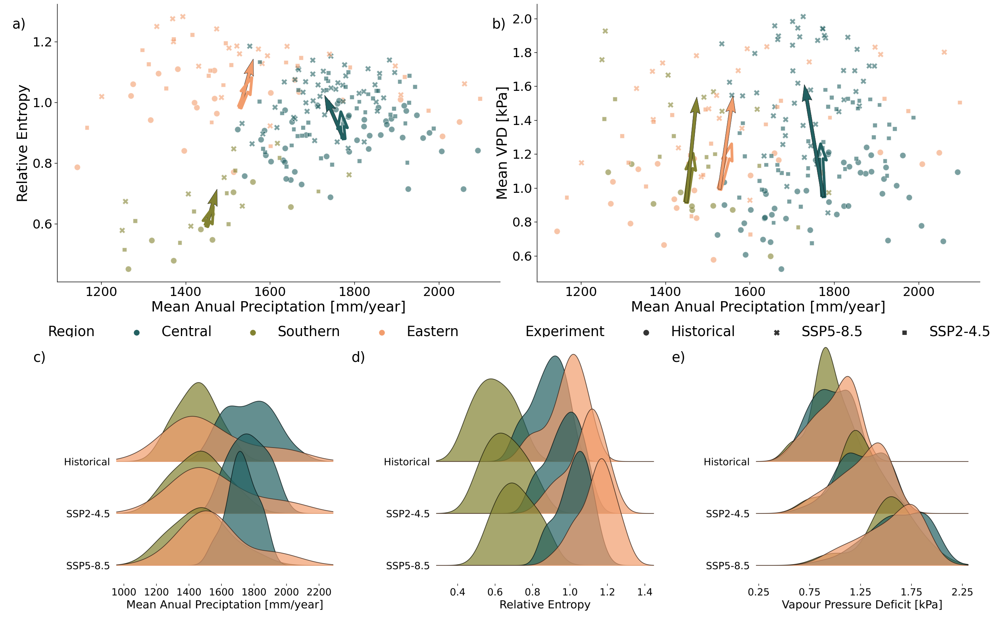

In [32]:
#plt subplots mosaic
fig, axes = plt.subplot_mosaic(
    """
    EEEFFF
    AABBCC
    """, figsize=(30, 20)
)
ms=120
fs= 26
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":8,"axes.labelsize":fs}) 
#delete E and create it bacj
sns.scatterplot(ax=axes['E'],data=dff, y='entropy', x='pr', hue='Region', style='Experiment', palette=palette, hue_order=hue_order, legend=True, alpha=0.6, zorder=-1, s=ms )
axes['E'].quiver(df_historical_mean['pr'], df_historical_mean['entropy'], df_vec_mean['pr'], df_vec_mean['entropy'], angles='xy', scale_units='xy', scale=1, alpha=1,
                  color=[palette[0], palette[2], palette[1]], linewidth = 0.5, ec='k',zorder=1)
axes['E'].quiver(df_historical_mean['pr'], df_historical_mean['entropy'], df_vec_mean245['pr'], df_vec_mean245['entropy'], angles='xy', scale_units='xy', scale=1, alpha=1,
                  color='none', linewidth = 5, ec=[palette[0], palette[2], palette[1]],  zorder=10)
axes['E'].set_ylabel('Relative Entropy', fontsize=16)
axes['E'].set_xlabel('Mean Anual Preciptation [mm/year]', fontsize=16)

sns.scatterplot(ax=axes['F'],data=dff, y='vpd', x='pr', hue='Region', style='Experiment', palette=palette, hue_order=hue_order, legend=False, alpha=0.6,zorder=-1, s=ms)
axes['F'].quiver(df_historical_mean['pr'], df_historical_mean['vpd'], df_vec_mean245['pr'], df_vec_mean245['vpd'], angles='xy', 
                 scale_units='xy', scale=1, alpha=1,
                color='none',linewidth = 5, ec=[palette[0], palette[2], palette[1]])
axes['F'].quiver(df_historical_mean['pr'], df_historical_mean['vpd'], df_vec_mean['pr'], df_vec_mean['vpd'], angles='xy', scale_units='xy', scale=1, alpha=1,
                  color=[palette[0], palette[2], palette[1]], linewidth = 0.5, ec='k')
axes['F'].set_ylabel('Mean VPD [kPa]', fontsize=16)
axes['F'].set_xlabel('Mean Anual Preciptation [mm/year]', fontsize=16)

#set the legend in the botton of axes E 
axes['A'].imshow(img_map)
axes['A'].axis('off')
axes['B'].imshow(img_ent)
axes['B'].axis('off')
axes['C'].imshow(img_vpd)
axes['C'].axis('off')

axes['E'].legend( loc='lower center', bbox_to_anchor=(1, -0.25), ncol=8, frameon=False, fontsize=25, markerscale=2)

#set ax A closer to the first row
axes['A'].set_anchor('N')
axes['B'].set_anchor('N')
axes['C'].set_anchor('N')


axes['E'].text(-0.07, 0.95, 'a)', transform=axes['E'].transAxes, fontsize=25, va='top', ha='right')
axes['F'].text(-0.07, 0.95, 'b)', transform=axes['F'].transAxes, fontsize=25, va='top', ha='right')
axes['A'].text(-0.05, 0.95, 'c)', transform=axes['A'].transAxes, fontsize=25, va='top', ha='right')
axes['B'].text(-0.05, 0.95, 'd)', transform=axes['B'].transAxes, fontsize=25, va='top', ha='right')
axes['C'].text(-0.05, 0.95, 'e)', transform=axes['C'].transAxes, fontsize=25, va='top', ha='right')
#despine E and F
for i in ['E', 'F']:
    sns.despine(ax=axes[i])
    #increase xticks label
    axes[i].tick_params(axis='both', labelsize=fs-3)
    #increase label x and y font size
    axes[i].set_xlabel(axes[i].get_xlabel(), fontsize=fs)
    axes[i].set_ylabel(axes[i].get_ylabel(), fontsize=fs)


fig.subplots_adjust(wspace=0.3)
#fig.tight_layout()
plt.savefig(r'Data\Plots_paper\7fig_vectors.png', dpi=600, bbox_inches='tight')

# SI

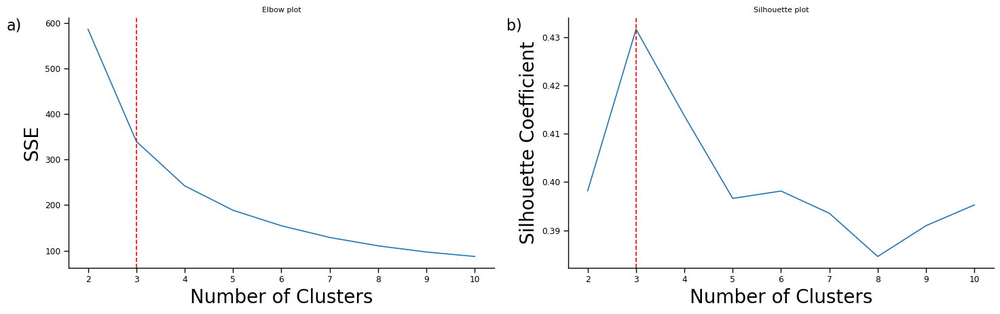

In [18]:
#plot Kmeans metrics
df_kmeans = pd.read_csv('kmeans_hyperparam.csv')
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].plot(range(2, 11), df_kmeans['sse'])
axs[0].set_title('Elbow plot')
axs[0].set_xlabel("Number of Clusters")
axs[0].set_ylabel("SSE")
axs[0].axvline(x=3, color='red', linestyle='--')

axs[1].plot(range(2, 11), df_kmeans['silhouette_coefficients'])
axs[1].set_title('Silhouette plot')
axs[1].set_xlabel("Number of Clusters")
axs[1].set_ylabel("Silhouette Coefficient")
axs[1].axvline(x=3, color='red', linestyle='--')
sns.despine(ax=axs[0])
sns.despine(ax=axs[1])
#write a) b) c) on the plots
axs[0].text(-0.11, 1, 'a)', transform=axs[0].transAxes, fontsize=16, va='top', ha='right')
axs[1].text(-0.11, 1, 'b)', transform=axs[1].transAxes, fontsize=16, va='top', ha='right')

plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_1fig_kmeans_elbow.png', dpi=1200, bbox_inches='tight')

In [19]:
df_stat_month= df_cerrado.groupby(['Code', df_cerrado.Date.dt.month]).mean().reset_index()
df_stat_month = df_stat_month.merge(gdf_knn[['Code', 'region']], on='Code', how='left')
df_stat_month['Central' ] = df_stat_month['Total'].where(df_stat_month['region']=='Central')
df_stat_month['Southern'] = df_stat_month['Total'].where(df_stat_month['region']=='Southern')
df_stat_month['Eastern' ] = df_stat_month['Total'].where(df_stat_month['region']=='Eastern')


C:\Users\luisg\AppData\Local\Temp\ipykernel_14524\313718987.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_stat_month= df_cerrado.groupby(['Code', df_cerrado.Date.dt.month]).mean().reset_index()


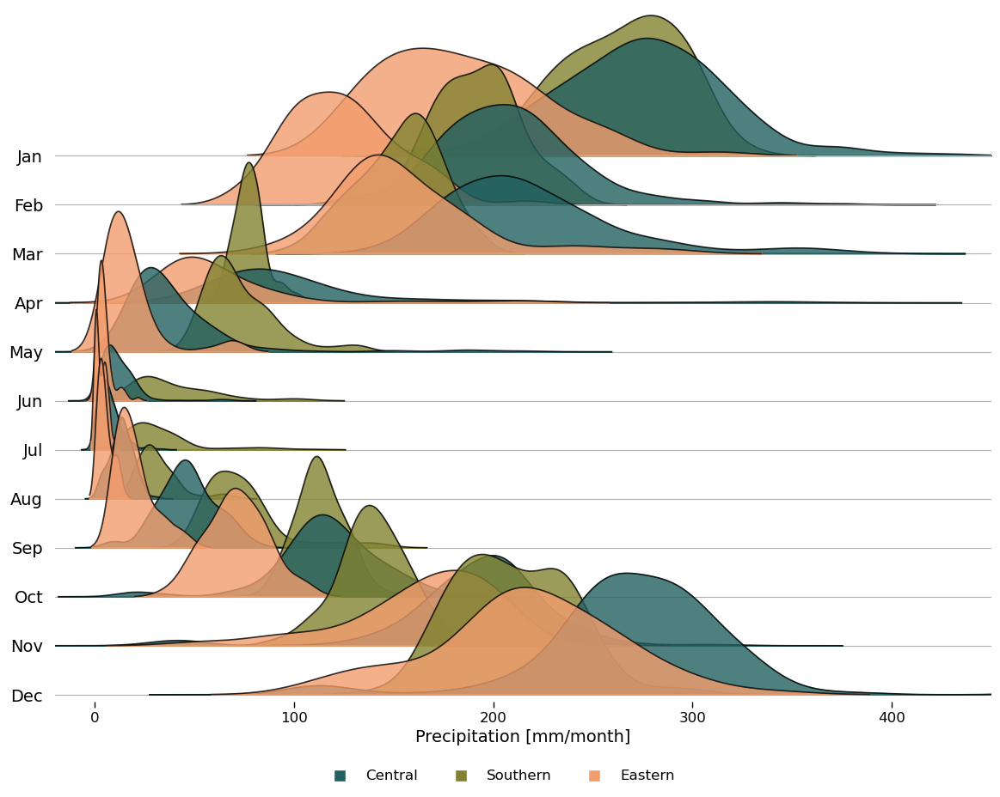

In [20]:
fig, axes = joypy.joyplot(df_stat_month, by='Date', column=['Southern','Central','Eastern'], figsize=(12,9), ylim='own', legend=False, color=[palette[1],palette[0],palette[2]], alpha=0.8,
                          range_style='own', 
                          grid="y",
                          x_range=[-20,450], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],xlabelsize=12,ylabelsize=14)

plt.xlabel('Precipitation [mm/month]', fontsize=14)
#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=10),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=10),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=10)]


fig.legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.05), loc='lower center', ncol=3, frameon=False, fontsize=12)
plt.savefig(r'Data\Plots_paper\SI_2fig_joypy.png', dpi=1200, bbox_inches='tight')

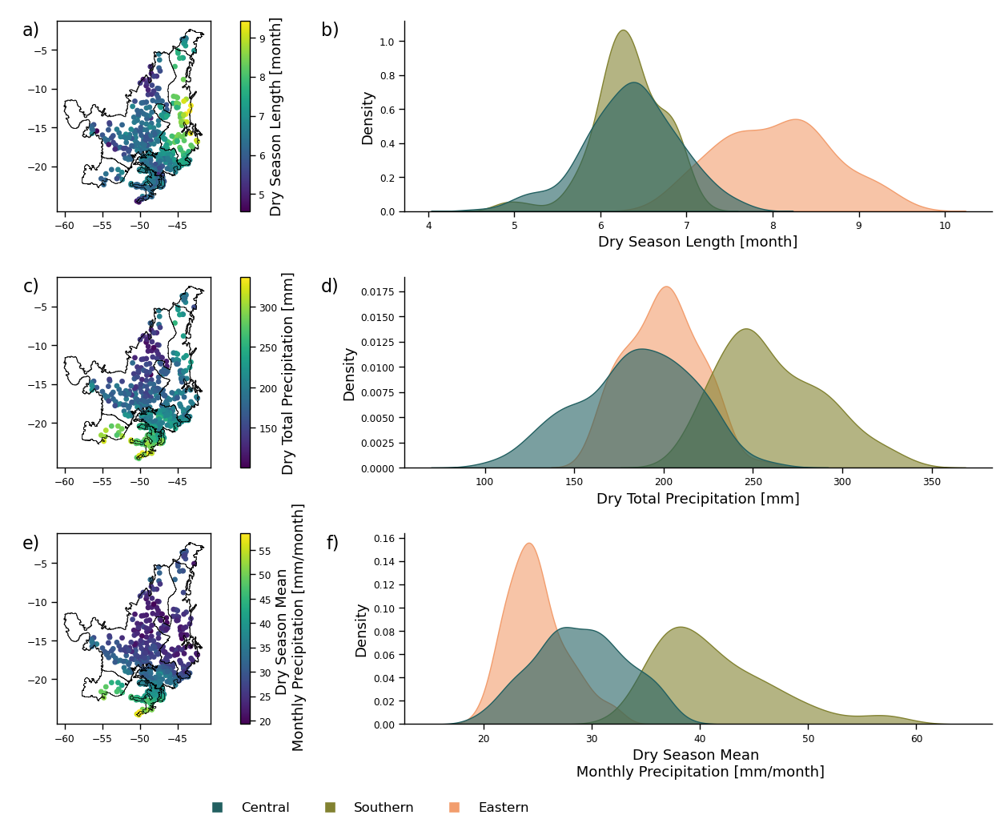

In [21]:
#plot maps and kde of metrics
from matplotlib.lines import Line2D
gdf_knn['dry_precip_month'] = gdf_knn['dry_precip']/ gdf_knn['dsl']
metrics_plot = ['dsl', 'dry_precip', 'dry_precip_month']
metrics_label = ['Dry Season Length [month]', 'Dry Total Precipitation [mm]', 'Dry Season Mean \n Monthly Precipitation [mm/month]']
cmaps = ['viridis', 'viridis', 'viridis']
fs= 13
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":8,"axes.labelsize":fs}) 

# plot map of each metric
fig, axes = plt.subplots(len(metrics_plot),2, figsize=(16, 10))
for i, metric in enumerate(metrics_plot):
    shp_cerrado.plot(ax=axes[i][0], color='white', edgecolor='black', linewidth=0.5)
    #ds_knn.knn.plot(ax=axes[i][0],  alpha=.6, levels=[0,1,2,3], add_colorbar=False, colors=palette)
    #regions.plot(column='region', cmap='cmc.batlow', ax=axes[i][0], alpha=0.7, legend=True, legend_kwds={'loc': 'upper left'})
    
    gdf_knn.plot(column=metric, ax=axes[i][0], legend=True, legend_kwds={'label': metrics_label[i]}, markersize=15, cmap=cmaps[i],linewidth=1)
    
    axes[i][0].set_title(' ')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    # y ticks 5 by 5 degrees
    axes[i][0].set_yticks(np.arange(-20, 0, 5))    
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)

    g = sns.kdeplot(x=metric, hue='region', data=gdf_knn, ax=axes[i][1], fill=True, common_norm=False, alpha=.6, linewidth=1, palette=palette, hue_order=['Central', 'Southern', 'Eastern'], legend=False)
    axes[i][1].set_xlabel(metrics_label[i])


#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')


#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=10),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=10),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=10)]


fig.legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.04), loc='lower center', ncol=3, frameon=False, fontsize=12)

sns.despine(ax=axes[1][1])
sns.despine(ax=axes[0][1])
sns.despine(ax=axes[2][1])
plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_3fig_DSL.png', dpi=1200, bbox_inches='tight')

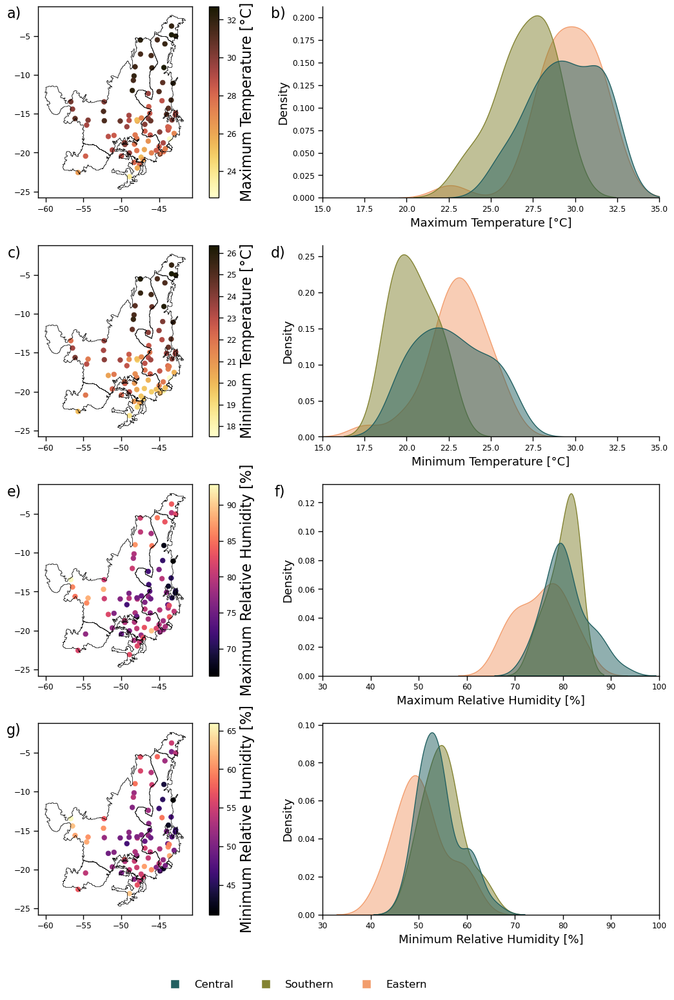

In [22]:
#VPD PLOT
metrics = ['Temp_max', 'Temp_min', 'RH_max', 'RH_min']
metrics_label = ['Maximum Temperature [°C]', 'Minimum Temperature [°C]', 'Maximum Relative Humidity [%]', 'Minimum Relative Humidity [%]']
cmaps = ['cmc.lajolla', 'cmc.lajolla', 'magma', 'magma']
fig, axes = plt.subplots(4,2, figsize=(12,15))
fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":8,"axes.labelsize":fs}) 
for i, metric in enumerate(metrics):

    gdf_inmet_clim.plot(column=metric, ax=axes[i][0], legend_kwds={'label': metrics_label[i]}, markersize=30, cmap=cmaps[i],linewidth=0.5, legend=True)
    #set axis xlimits
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)

    sns.kdeplot(x=metric, hue='region', data=gdf_inmet_clim, ax=axes[i][1], fill=True, common_norm=False,
                alpha=.5, linewidth=1, palette=palette, hue_order=['Central', 'Southern', 'Eastern'], legend=False)

   #write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')
axes[3][0].text(-0.11, 1, 'g)', transform=axes[3][0].transAxes, fontsize=16, va='top', ha='right')



axes[0][1].set_xlim(15,35)
axes[1][1].set_xlim(15,35)
axes[2][1].set_xlim(30,100)
axes[3][1].set_xlim(30,100)
axes[0][1].set_xlabel(metrics_label[0])
axes[1][1].set_xlabel(metrics_label[1])
axes[2][1].set_xlabel(metrics_label[2])
axes[3][1].set_xlabel(metrics_label[3])
sns.despine(ax=axes[1][1])
sns.despine(ax=axes[0][1])
#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=10),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=10),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=10)]


fig.legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.04), loc='lower center', ncol=3, frameon=False, fontsize=12)

plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_4fig_INMET_metrics.png', dpi=1200, bbox_inches='tight')

## trends

### percentage

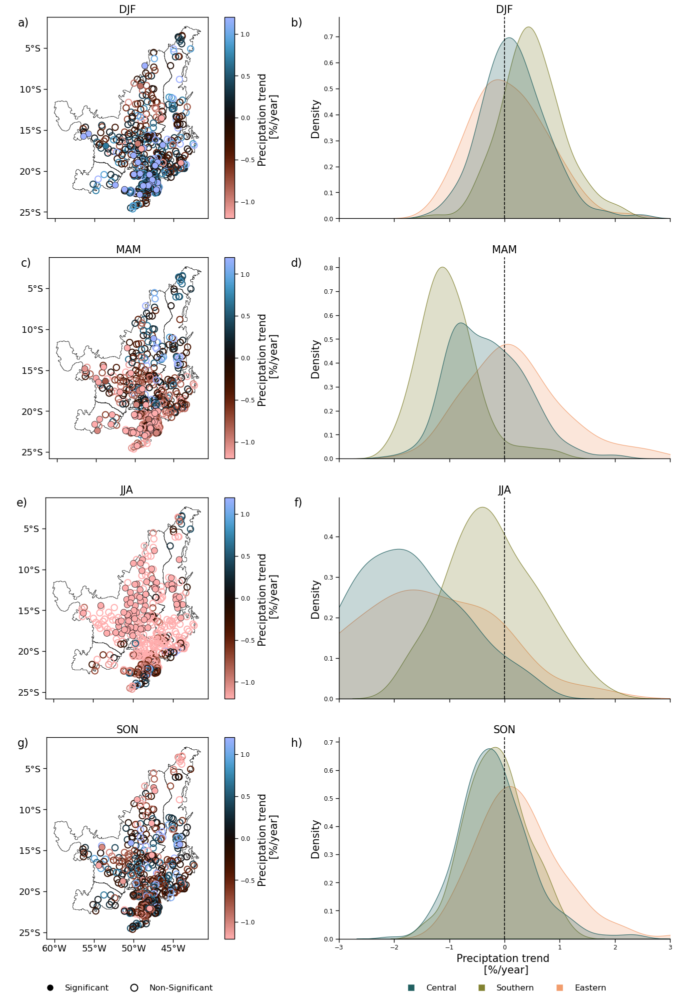

In [23]:
#plot each period
fig, axes = plt.subplots(4,2, figsize=(15, 20), sharex='col')

ms = 80
fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 


#plot regions for all plots in first column
for i in range(4):
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)
    axes[i][1].axvline(x=0, color='black', linestyle='--')
    sns.despine(ax=axes[i][1])
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)

vmax = 1.2
vmin = -1.2
cmap = cm.berlin_r
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

for i, sea in enumerate(['DJF', 'MAM', 'JJA', 'SON']):
        gdf_mk_pr_ent[gdf_mk_pr_ent['p_' + sea] > 0.05].plot(edgecolor=cmap(norm(gdf_mk_pr_ent['pr_ratio_' + sea].values)), ax=axes[i][0], markersize=ms,
                linewidth=1.5, marker='o',color='none')
        gdf_mk_pr_ent[gdf_mk_pr_ent['p_' + sea] <= 0.05].plot(column='pr_ratio_' + sea, ax=axes[i][0], cmap=cmap, markersize=ms,
            edgecolor='black', linewidth=0.5, marker='o', legend=True, vmax=vmax, vmin=vmin, legend_kwds={'label': "Preciptation trend \n [%/year]"})
        
        sns.kdeplot(gdf_mk_pr_ent, legend=False, hue= 'region', x='pr_ratio_' + sea, fill=True, palette=palette, hue_order=hue_order, ax=axes[i][1], common_norm=False)

        axes[i][0].set_title(sea)
        axes[i][1].set_title(sea)
#axes[0][1].set_xlabel('Preciptation Change \n [%]')



#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')
axes[3][0].text(-0.11, 1, 'g)', transform=axes[3][0].transAxes, fontsize=16, va='top', ha='right')
axes[3][1].text(-0.11, 1, 'h)', transform=axes[3][1].transAxes, fontsize=16, va='top', ha='right')



#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=10),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=10),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=10)]



#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[3][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=10),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=10, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=12)

axes[3][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=12)

axes[3][1].set_xlim(-3, 3)
axes[3][1].set_xlabel('Preciptation trend \n [%/year]')
plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_5fig_trends_ratio_pr.png', dpi=1200, bbox_inches='tight')

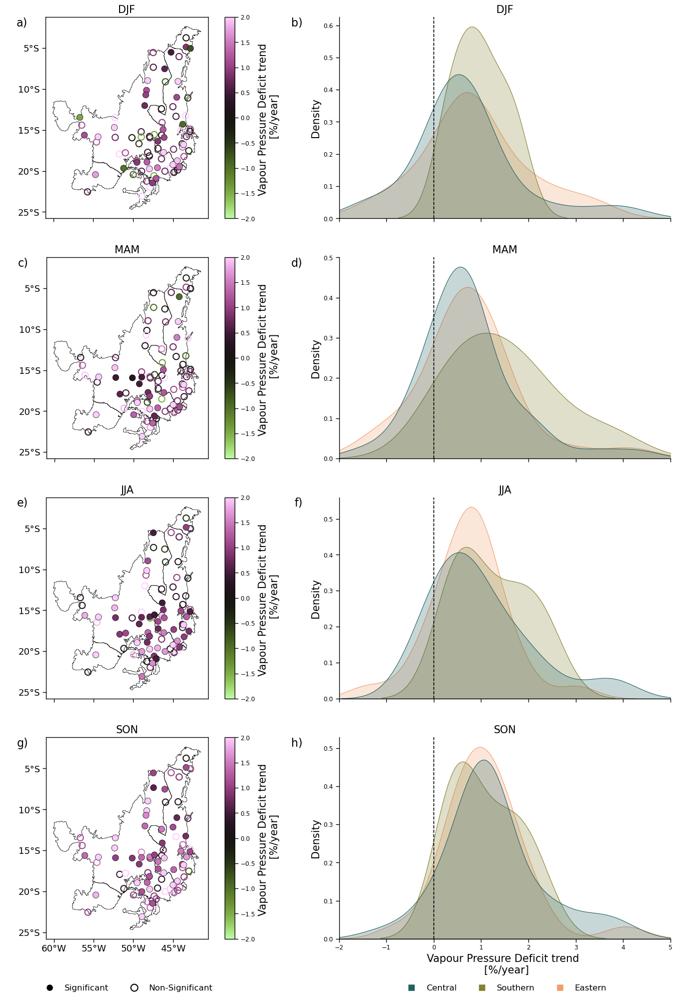

In [22]:
#plot each period
fig, axes = plt.subplots(4,2, figsize=(15, 20), sharex='col')

ms = 80
fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 


#plot regions for all plots in first column
for i in range(4):
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)
    axes[i][1].axvline(x=0, color='black', linestyle='--')
    sns.despine(ax=axes[i][1])
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)

vmax = 2
vmin = -2
cmap = cm.vanimo_r
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
#orm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
for i, sea in enumerate(['DJF', 'MAM', 'JJA', 'SON']):
        gdf_mk_vpd[gdf_mk_vpd['p_' + sea] > 0.05].plot(edgecolor=cmap(norm(gdf_mk_vpd['VPD_ratio_' + sea].values)), ax=axes[i][0], markersize=ms,
                linewidth=1.5, marker='o',color='none')
        gdf_mk_vpd[gdf_mk_vpd['p_' + sea] <= 0.05].plot(column='VPD_ratio_' + sea, ax=axes[i][0], cmap=cmap, markersize=ms,
            edgecolor='black', linewidth=0.5, marker='o', legend=True, vmax=vmax, vmin=vmin, legend_kwds={'label': "Vapour Pressure Deficit trend \n [%/year]"})
        
        sns.kdeplot(gdf_mk_vpd, legend=False, hue= 'region', x='VPD_ratio_' + sea, fill=True, palette=palette, hue_order=hue_order, ax=axes[i][1], common_norm=False)
        axes[i][0].set_title(sea)
        axes[i][1].set_title(sea)
#axes[0][1].set_xlabel('Preciptation Change \n [%]')



#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')
axes[3][0].text(-0.11, 1, 'g)', transform=axes[3][0].transAxes, fontsize=16, va='top', ha='right')
axes[3][1].text(-0.11, 1, 'h)', transform=axes[3][1].transAxes, fontsize=16, va='top', ha='right')


axes[3][1].set_xlim(-2, 5)
axes[3][1].set_xlabel('Vapour Pressure Deficit trend \n [%/year]')
#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=10),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=10),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=10)]



#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[3][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=10),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=10, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=12)

axes[3][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=12)
plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_6fig_trends_ratio_vpd.png', dpi=1200, bbox_inches='tight')

### slope

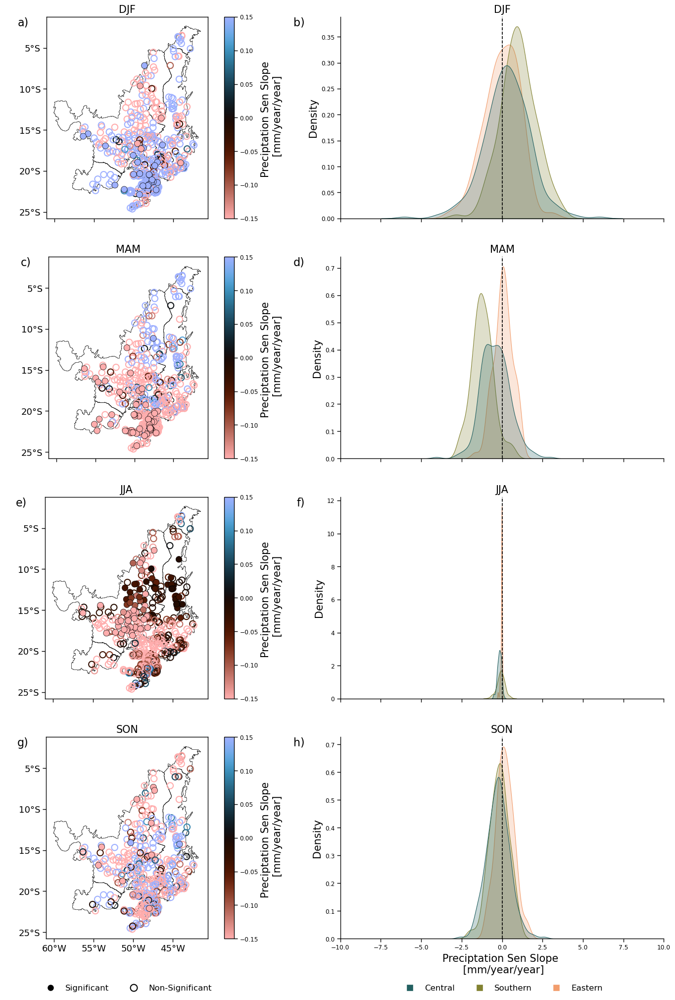

In [25]:
#trend slope pr
#plot each period
fig, axes = plt.subplots(4,2, figsize=(15, 20), sharex='col')

ms = 80
fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 


#plot regions for all plots in first column
for i in range(4):
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)
    axes[i][1].axvline(x=0, color='black', linestyle='--')
    sns.despine(ax=axes[i][1])
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)

vmax = 0.15
vmin = -0.15
cmap = cm.berlin_r
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

for i, sea in enumerate(['DJF', 'MAM', 'JJA', 'SON']):
        gdf_mk_pr_ent[gdf_mk_pr_ent['p_' + sea] > 0.05].plot(edgecolor=cmap(norm(gdf_mk_pr_ent['slope_' + sea].values)), ax=axes[i][0], markersize=ms,
                linewidth=1.5, marker='o',color='none')
        gdf_mk_pr_ent[gdf_mk_pr_ent['p_' + sea] <= 0.05].plot(column='slope_' + sea, ax=axes[i][0], cmap=cmap, markersize=ms,
            edgecolor='black', linewidth=0.5, marker='o', legend=True, vmax=vmax, vmin=vmin, legend_kwds={'label': 'Preciptation Sen Slope \n [mm/year/year]'})
        
        sns.kdeplot(gdf_mk_pr_ent, legend=False, hue= 'region', x='slope_' + sea, fill=True, palette=palette, hue_order=hue_order, ax=axes[i][1], common_norm=False)
        axes[i][0].set_title(sea)
        axes[i][1].set_title(sea)



#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')
axes[3][0].text(-0.11, 1, 'g)', transform=axes[3][0].transAxes, fontsize=16, va='top', ha='right')
axes[3][1].text(-0.11, 1, 'h)', transform=axes[3][1].transAxes, fontsize=16, va='top', ha='right')


axes[3][1].set_xlim(-10, 10)
axes[3][1].set_xlabel('Preciptation Sen Slope \n [mm/year/year]')
plt.tight_layout()
#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=10),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=10),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=10)]



#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[3][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=10),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=10, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=12)

axes[3][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=12)


plt.savefig(r'Data\Plots_paper\SI_7fig_trends_slope_pr.png', dpi=1200, bbox_inches='tight')

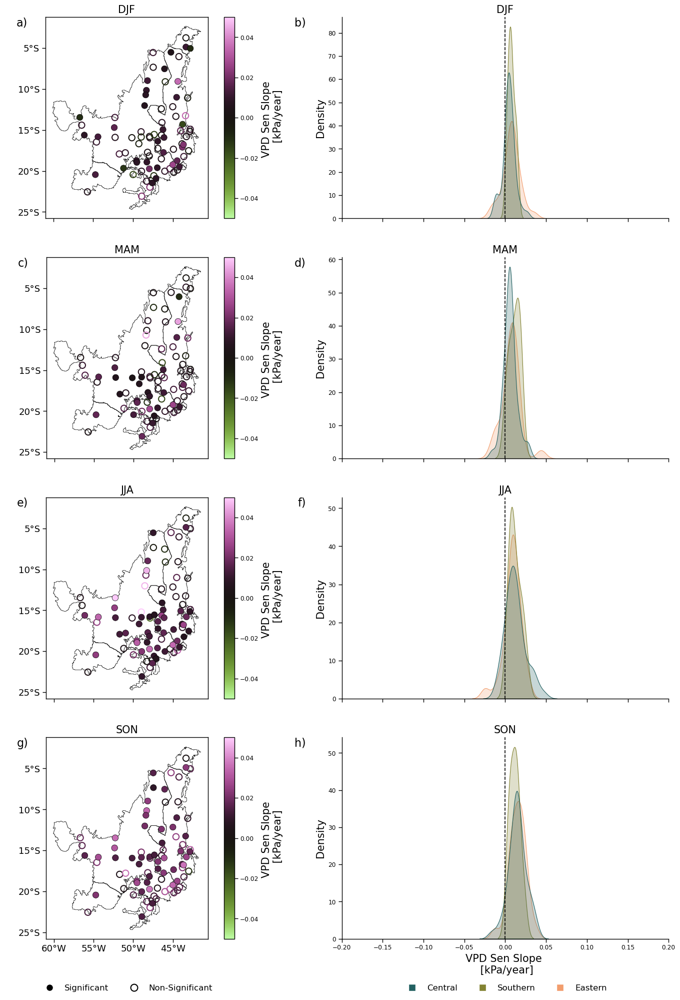

In [26]:
#trend slope pr
#plot each period
fig, axes = plt.subplots(4,2, figsize=(15, 20), sharex='col')

ms = 80
fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 

#plot regions for all plots in first column
for i in range(4):
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)
    axes[i][1].axvline(x=0, color='black', linestyle='--')
    sns.despine(ax=axes[i][1])
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)

vmax = 0.05
vmin = -0.05
cmap = cm.vanimo_r
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

for i, sea in enumerate(['DJF', 'MAM', 'JJA', 'SON']):
        gdf_mk_vpd[gdf_mk_vpd['p_' + sea] > 0.05].plot(edgecolor=cmap(norm(gdf_mk_vpd['slope_' + sea].values)), ax=axes[i][0], markersize=ms,
                linewidth=1.5, marker='o',color='none')
        gdf_mk_vpd[gdf_mk_vpd['p_' + sea] <= 0.05].plot(column='slope_' + sea, ax=axes[i][0], cmap=cmap, markersize=ms,
            edgecolor='black', linewidth=0.5, marker='o', legend=True, vmax=vmax, vmin=vmin, legend_kwds={'label': 'VPD Sen Slope \n [kPa/year]'})
        
        sns.kdeplot(gdf_mk_vpd, legend=False, hue= 'region', x='slope_' + sea, fill=True, palette=palette, hue_order=hue_order, ax=axes[i][1], common_norm=False)
        axes[i][0].set_title(sea)
        axes[i][1].set_title(sea)



#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')
axes[3][0].text(-0.11, 1, 'g)', transform=axes[3][0].transAxes, fontsize=16, va='top', ha='right')
axes[3][1].text(-0.11, 1, 'h)', transform=axes[3][1].transAxes, fontsize=16, va='top', ha='right')


axes[3][1].set_xlim(-0.2, 0.2)
axes[3][1].set_xlabel('VPD Sen Slope \n [kPa/year]')
#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=10),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=10),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=10)]



#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[3][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=10),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=10, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=12)

axes[3][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=12)

plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_8fig_trends_slope_vpd.png', dpi=1200, bbox_inches='tight')

#### annual

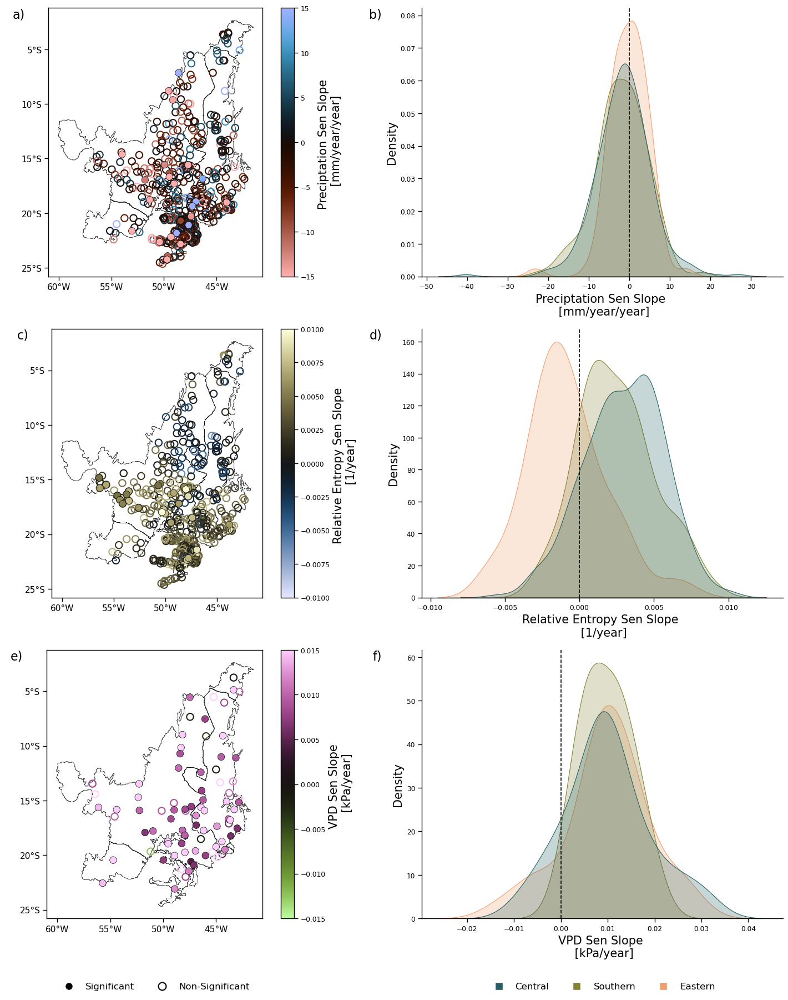

In [27]:
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

ms = 80
fs= 13

#plot regions for all plots in first column
for i in range(3):
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)
    axes[i][1].axvline(x=0, color='black', linestyle='--')
    sns.despine(ax=axes[i][1])
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)

cmap = cm.berlin_r
vmin= -15
vmax= 15
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

gdf_mk_pr_ent[gdf_mk_pr_ent.p_anual > 0.05].plot(edgecolor=cmap(norm(gdf_mk_pr_ent.slope_anual.values)), ax=axes[0][0], markersize=ms,
        linewidth=1.5, marker='o',color='none')
gdf_mk_pr_ent[gdf_mk_pr_ent.p_anual <= 0.05].plot(column='slope_anual', ax=axes[0][0], cmap=cmap, markersize=ms,
    edgecolor='black', linewidth=0.5, marker='o', legend=True, vmin=vmin, vmax=vmax, legend_kwds={'label': "Preciptation Sen Slope \n [mm/year/year]"})

sns.kdeplot(gdf_mk_pr_ent, legend=False, hue= 'region', x='slope_anual', fill=True, palette=palette, hue_order=hue_order, ax=axes[0][1], common_norm=False)
axes[0][1].set_xlabel('Preciptation Sen Slope \n [mm/year/year]')

cmap = cm.lisbon
vmin= -0.010
vmax= 0.010
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
gdf_mk_pr_ent[gdf_mk_pr_ent.p_anual > 0.05].plot(edgecolor=cmap(norm(gdf_mk_pr_ent.slope_ent.values)), linewidth=1.5, marker='o',markersize=ms,
                                                  legend=False,color='none', ax=axes[1][0])    
gdf_mk_pr_ent[gdf_mk_pr_ent.p_ent <= 0.05].plot(column='slope_ent', ax=axes[1][0], cmap=cmap,markersize=ms,
edgecolor='black', linewidth=0.5, marker='o', legend=True, vmin=vmin, vmax=vmax, legend_kwds={'label': "Relative Entropy Sen Slope \n [1/year]"})

sns.kdeplot(gdf_mk_pr_ent, legend=False, hue= 'region', x='slope_ent', fill=True, palette=palette, hue_order=hue_order, ax=axes[1][1], common_norm=False)
axes[1][1].set_xlabel('Relative Entropy Sen Slope \n [1/year]')
#

cmap = cm.vanimo_r
vmin= -0.015
vmax= 0.015
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax,)
gdf_mk_vpd[gdf_mk_vpd.p_anual > 0.05].plot(edgecolor=cmap(norm(gdf_mk_vpd.slope_anual.values)), linewidth=1.5, marker='o', markersize=ms,
                                           legend=False,color='none', ax=axes[2][0])    
gdf_mk_vpd[gdf_mk_vpd.p_anual <= 0.05].plot(column='slope_anual', ax=axes[2][0], cmap=cmap,markersize=ms,
 edgecolor='black', linewidth=0.5, marker='o', legend=True, vmin=vmin, vmax=vmax, legend_kwds={'label': "VPD Sen Slope \n [kPa/year]"})
#gdf_mk_vpd[gdf_mk_vpd.p_anual > 0.05].plot(column='VPD_slope_anual', ax=axes[2][0], cmap='cmc.vik',
# edgecolor='black', linewidth=0.5, marker='*',vmax=70, vmin=-70)

sns.kdeplot(gdf_mk_vpd, legend=False, hue= 'region', x='slope_anual', fill=True, palette=palette, hue_order=hue_order, ax=axes[2][1], common_norm=False)
axes[2][1].set_xlabel('VPD Sen Slope \n [kPa/year]')
#
#

#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')


#vreate a legend for the figure, with colors and labels
legend_elements = [Line2D([0], [0],    marker='s', color='w', label='Central', markerfacecolor=palette[0], markersize=10),
                     Line2D([0], [0], marker='s', color='w', label='Southern', markerfacecolor=palette[1], markersize=10),
                        Line2D([0], [0], marker='s', color='w', label='Eastern', markerfacecolor=palette[2], markersize=10)]



#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[2][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=10),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=10, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=12)

axes[2][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=12)



plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_9fig_trends_slope_annual.png', dpi=1200, bbox_inches='tight')

### temp and RH

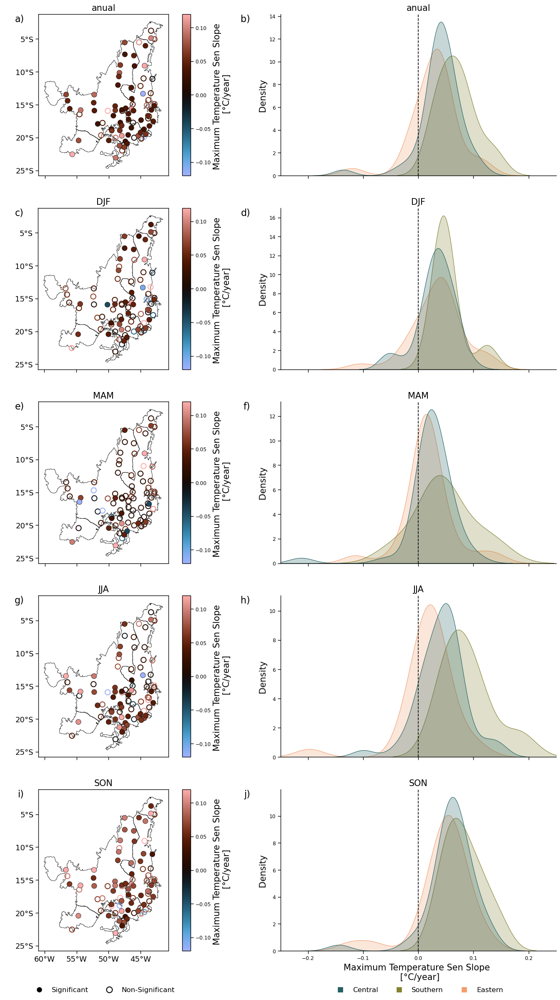

In [28]:
#trend slope_Temp_max pr
#plot each period
fig, axes = plt.subplots(5,2, figsize=(15, 24), sharex='col')

ms = 80
fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 



#plot regions for all plots in first column
for i in range(5):
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)
    axes[i][1].axvline(x=0, color='black', linestyle='--')
    sns.despine(ax=axes[i][1])
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)

vmax = 0.12
vmin = -0.12
cmap = cm.berlin
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
#slope_Temp_max_DJF	
for i, sea in enumerate(['anual', 'DJF', 'MAM', 'JJA', 'SON']):
        gdf_mk_vpd[gdf_mk_vpd['p_Temp_max_' + sea] > 0.05].plot(edgecolor=cmap(norm(gdf_mk_vpd['slope_Temp_max_' + sea].values)), ax=axes[i][0], markersize=ms,
                linewidth=1.5, marker='o',color='none')
        gdf_mk_vpd[gdf_mk_vpd['p_Temp_max_' + sea] <= 0.05].plot(column='slope_Temp_max_' + sea, ax=axes[i][0], cmap=cmap, markersize=ms,
            edgecolor='black', linewidth=0.5, marker='o', legend=True, vmax=vmax, vmin=vmin, legend_kwds={'label': 'Maximum Temperature Sen Slope \n [°C/year]'})
        
        sns.kdeplot(gdf_mk_vpd, legend=False, hue= 'region', x='slope_Temp_max_' + sea, fill=True, palette=palette, hue_order=hue_order, ax=axes[i][1], common_norm=False)
        axes[i][0].set_title(sea)
        axes[i][1].set_title(sea)


#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')
axes[3][0].text(-0.11, 1, 'g)', transform=axes[3][0].transAxes, fontsize=16, va='top', ha='right')
axes[3][1].text(-0.11, 1, 'h)', transform=axes[3][1].transAxes, fontsize=16, va='top', ha='right')
axes[4][0].text(-0.11, 1, 'i)', transform=axes[4][0].transAxes, fontsize=16, va='top', ha='right')
axes[4][1].text(-0.11, 1, 'j)', transform=axes[4][1].transAxes, fontsize=16, va='top', ha='right')


axes[4][1].set_xlim(-0.25, 0.25)
axes[4][1].set_xlabel('Maximum Temperature Sen Slope \n [°C/year]')
#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[4][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=10),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=10, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=12)

axes[4][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=12)


plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_10fig_trends_slope_tmax.png', dpi=1200, bbox_inches='tight')

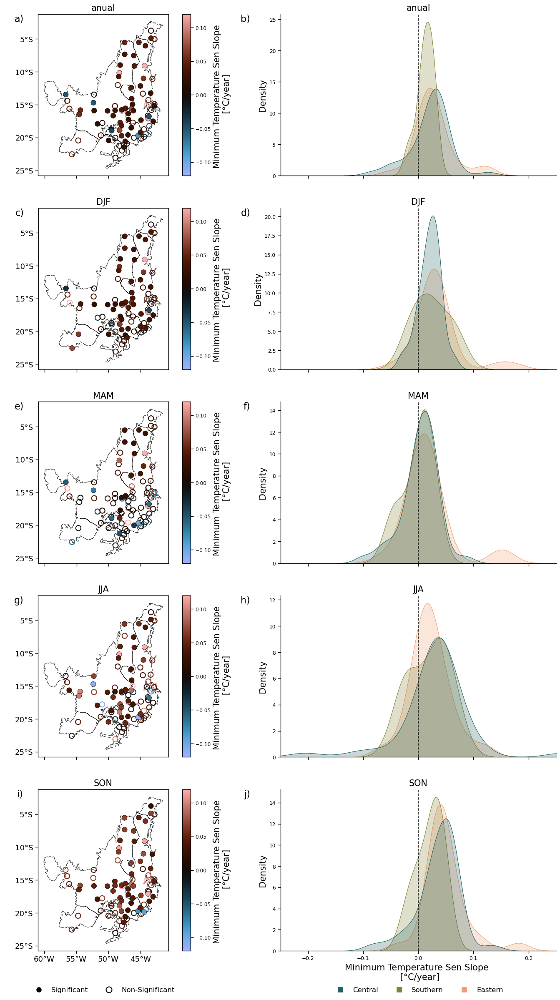

In [29]:
#trend slope_Temp_max pr
#plot each period
fig, axes = plt.subplots(5,2, figsize=(15, 24), sharex='col')

ms = 80
fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 


#plot regions for all plots in first column
for i in range(5):
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)
    axes[i][1].axvline(x=0, color='black', linestyle='--')
    sns.despine(ax=axes[i][1])
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)

vmax = 0.12
vmin = -0.12
cmap = cm.berlin
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
#slope_Temp_min_DJF	
for i, sea in enumerate(['anual', 'DJF', 'MAM', 'JJA', 'SON']):
        gdf_mk_vpd[gdf_mk_vpd['p_Temp_min_' + sea] > 0.05].plot(edgecolor=cmap(norm(gdf_mk_vpd['slope_Temp_min_' + sea].values)), ax=axes[i][0], markersize=ms,
                linewidth=1.5, marker='o',color='none')
        gdf_mk_vpd[gdf_mk_vpd['p_Temp_min_' + sea] <= 0.05].plot(column='slope_Temp_min_' + sea, ax=axes[i][0], cmap=cmap, markersize=ms,
            edgecolor='black', linewidth=0.5, marker='o', legend=True, vmax=vmax, vmin=vmin, legend_kwds={'label': 'Minimum Temperature Sen Slope \n [°C/year]'})
        
        sns.kdeplot(gdf_mk_vpd, legend=False, hue= 'region', x='slope_Temp_min_' + sea, fill=True, palette=palette, hue_order=hue_order, ax=axes[i][1], common_norm=False)

        axes[i][0].set_title(sea)
        axes[i][1].set_title(sea)


#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')
axes[3][0].text(-0.11, 1, 'g)', transform=axes[3][0].transAxes, fontsize=16, va='top', ha='right')
axes[3][1].text(-0.11, 1, 'h)', transform=axes[3][1].transAxes, fontsize=16, va='top', ha='right')
axes[4][0].text(-0.11, 1, 'i)', transform=axes[4][0].transAxes, fontsize=16, va='top', ha='right')
axes[4][1].text(-0.11, 1, 'j)', transform=axes[4][1].transAxes, fontsize=16, va='top', ha='right')


axes[4][1].set_xlim(-0.25, 0.25)
axes[4][1].set_xlabel('Minimum Temperature Sen Slope \n [°C/year]')
#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[4][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=10),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=10, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=12)

axes[4][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=12)


plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_11fig_trends_slope_tmin.png', dpi=1200, bbox_inches='tight')

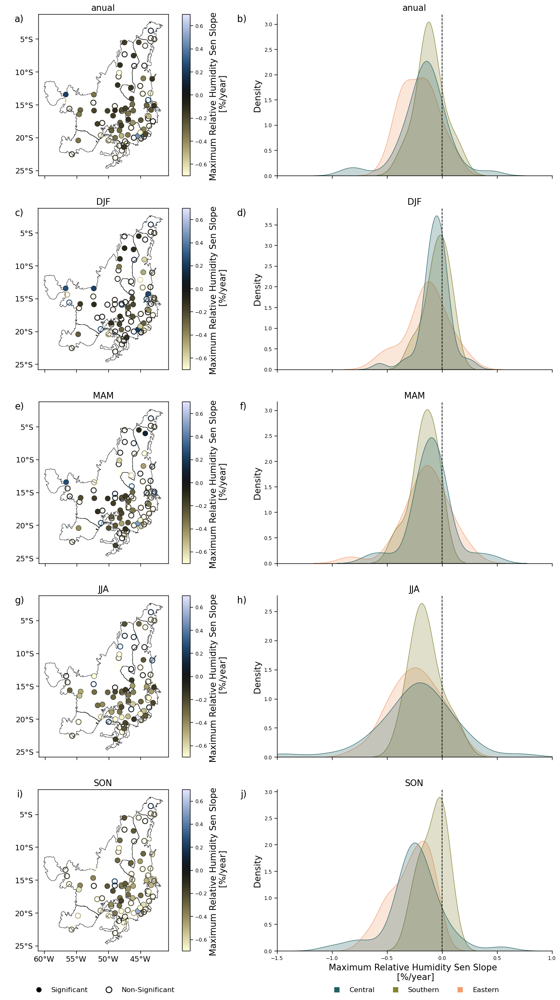

In [25]:
#trend slope_RH_max pr
#plot each period
fig, axes = plt.subplots(5,2, figsize=(15, 24), sharex='col')

ms = 80
fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 


#plot regions for all plots in first column
for i in range(5):
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)
    axes[i][1].axvline(x=0, color='black', linestyle='--')
    sns.despine(ax=axes[i][1])
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)

vmax = 0.7
vmin = -0.7
cmap = cm.lisbon_r
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
#slope_RH_max_DJF	
for i, sea in enumerate(['anual', 'DJF', 'MAM', 'JJA', 'SON']):
        gdf_mk_vpd[gdf_mk_vpd['p_RH_max_' + sea] > 0.05].plot(edgecolor=cmap(norm(gdf_mk_vpd['slope_RH_max_' + sea].values)), ax=axes[i][0], markersize=ms,
                linewidth=1.5, marker='o',color='none')
        gdf_mk_vpd[gdf_mk_vpd['p_RH_max_' + sea] <= 0.05].plot(column='slope_RH_max_' + sea, ax=axes[i][0], cmap=cmap, markersize=ms,
            edgecolor='black', linewidth=0.5, marker='o', legend=True, vmax=vmax, vmin=vmin, legend_kwds={'label': 'Maximum Relative Humidity Sen Slope \n [%/year]'})
        
        sns.kdeplot(gdf_mk_vpd, legend=False, hue= 'region', x='slope_RH_max_' + sea, fill=True, palette=palette, hue_order=hue_order, ax=axes[i][1], common_norm=False)
        axes[i][0].set_title(sea)
        axes[i][1].set_title(sea)


#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')
axes[3][0].text(-0.11, 1, 'g)', transform=axes[3][0].transAxes, fontsize=16, va='top', ha='right')
axes[3][1].text(-0.11, 1, 'h)', transform=axes[3][1].transAxes, fontsize=16, va='top', ha='right')
axes[4][0].text(-0.11, 1, 'i)', transform=axes[4][0].transAxes, fontsize=16, va='top', ha='right')
axes[4][1].text(-0.11, 1, 'j)', transform=axes[4][1].transAxes, fontsize=16, va='top', ha='right')

#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[4][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=10),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=10, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=12)

axes[4][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=12)


axes[4][1].set_xlim(-1.5, 1)
axes[4][1].set_xlabel('Maximum Relative Humidity Sen Slope \n [%/year]')
plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_12fig_trends_slope_rhmax.png', dpi=1200, bbox_inches='tight')

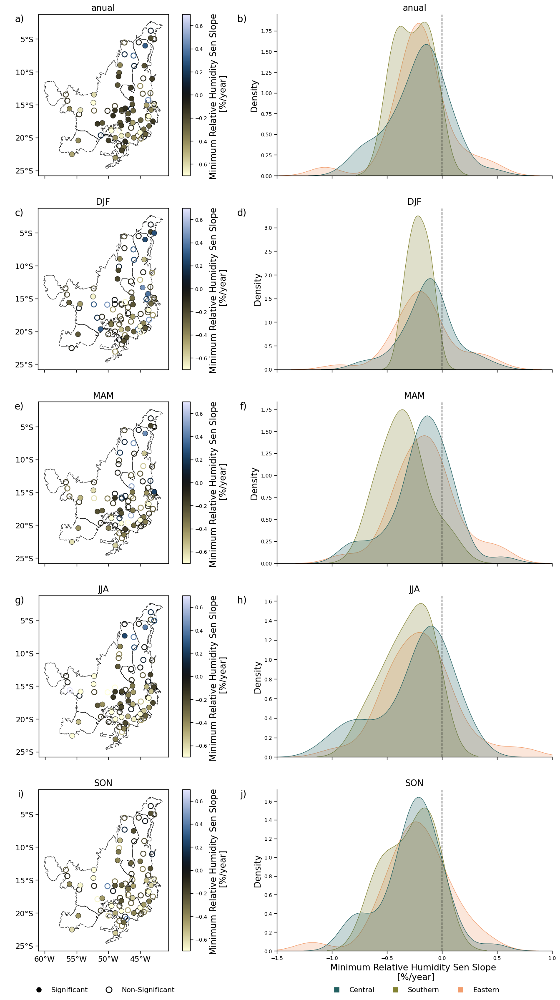

In [24]:
#trend slope_RH_max pr
#plot each period
fig, axes = plt.subplots(5,2, figsize=(15, 24), sharex='col')

ms = 80
fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 


#set the labels
axes[0][0].set_title('Anual')
axes[1][0].set_title('DJF')
axes[2][0].set_title('MAM')
axes[3][0].set_title('JJA')
axes[4][0].set_title('SON')

#plot regions for all plots in first column
for i in range(5):
    regions.plot(ax=axes[i][0], facecolor="none", edgecolor='black', linewidth=0.5)
    axes[i][1].axvline(x=0, color='black', linestyle='--')
    sns.despine(ax=axes[i][1])
    axes[i][0].xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    axes[i][0].yaxis.set_major_formatter(LATITUDE_FORMATTER)
    #axes[i][0].coastlines(resolution="50m", linewidth=1, color='grey')
    #axes[i][0].add_feature(cartopy.feature.BORDERS, linewidth=1, color='grey')
    axes[i][0].set_xlabel(' ')
    axes[i][0].set_ylabel(' ')
    axes[i][0].set_xticks(np.arange(-60, -40, 5))
    axes[i][0].set_yticks(np.arange(-25, 0, 5))
    axes[i][0].tick_params(axis='both', labelsize=fs-2)

vmax = 0.7
vmin = -0.7
cmap = cm.lisbon_r
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
#slope_RH_min_DJF	
for i, sea in enumerate(['anual', 'DJF', 'MAM', 'JJA', 'SON']):
        gdf_mk_vpd[gdf_mk_vpd['p_RH_min_' + sea] > 0.05].plot(edgecolor=cmap(norm(gdf_mk_vpd['slope_RH_min_' + sea].values)), ax=axes[i][0], markersize=ms,
                linewidth=1.5, marker='o',color='none')
        gdf_mk_vpd[gdf_mk_vpd['p_RH_min_' + sea] <= 0.05].plot(column='slope_RH_min_' + sea, ax=axes[i][0], cmap=cmap, markersize=ms,
            edgecolor='black', linewidth=0.5, marker='o', legend=True, vmax=vmax, vmin=vmin, legend_kwds={'label': 'Minimum Relative Humidity Sen Slope \n [%/year]'})
        
        sns.kdeplot(gdf_mk_vpd, legend=False, hue= 'region', x='slope_RH_min_' + sea, fill=True, palette=palette, hue_order=hue_order, ax=axes[i][1], common_norm=False)
        axes[i][0].set_title(sea)
        axes[i][1].set_title(sea)


#write a), b), c), d) for each plot 
axes[0][0].text(-0.11, 1, 'a)', transform=axes[0][0].transAxes, fontsize=16, va='top', ha='right')
axes[0][1].text(-0.11, 1, 'b)', transform=axes[0][1].transAxes, fontsize=16, va='top', ha='right')
axes[1][0].text(-0.11, 1, 'c)', transform=axes[1][0].transAxes, fontsize=16, va='top', ha='right')
axes[1][1].text(-0.11, 1, 'd)', transform=axes[1][1].transAxes, fontsize=16, va='top', ha='right')
axes[2][0].text(-0.11, 1, 'e)', transform=axes[2][0].transAxes, fontsize=16, va='top', ha='right')
axes[2][1].text(-0.11, 1, 'f)', transform=axes[2][1].transAxes, fontsize=16, va='top', ha='right')
axes[3][0].text(-0.11, 1, 'g)', transform=axes[3][0].transAxes, fontsize=16, va='top', ha='right')
axes[3][1].text(-0.11, 1, 'h)', transform=axes[3][1].transAxes, fontsize=16, va='top', ha='right')
axes[4][0].text(-0.11, 1, 'i)', transform=axes[4][0].transAxes, fontsize=16, va='top', ha='right')
axes[4][1].text(-0.11, 1, 'j)', transform=axes[4][1].transAxes, fontsize=16, va='top', ha='right')


axes[4][1].set_xlim(-1.5, 1)
axes[4][1].set_xlabel('Minimum Relative Humidity Sen Slope \n [%/year]')
#insert a legend below 1st column : point marker as significant trends and star marker as non-significant trends
axes[4][0].legend(handles=[Line2D([0], [0], marker='o', color='w', label='Significant', markerfacecolor='black', markersize=10),
                            Line2D([0], [0], marker='o', color='w', label='Non-Significant', markerfacecolor='none', markersize=10, markeredgecolor='black', markeredgewidth=1.5)],
                            loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2,frameon=False, fontsize=12)

axes[4][1].legend(handles=legend_elements, bbox_to_anchor=(0.5, -0.3), loc='lower center', ncol=3, frameon=False, fontsize=12)


plt.tight_layout()
plt.savefig(r'Data\Plots_paper\SI_13fig_trends_slope_rhmin.png', dpi=1200, bbox_inches='tight')

## CMIP

In [32]:
#set pr, ent, vpd
ds_historical_pr = xr.open_dataset('Data\CMIP6\pr_historical_bests_models.nc')
ds_historical_ent = xr.open_dataset('Data\CMIP6\ent_historical_bests_models.nc')
ds_historical_vpd = xr.open_dataset(r'Data\CMIP6\vpd_historical_bests_models.nc')
ds_ssp585_pr = xr.open_dataset('Data\CMIP6\pr_ssp585_bests_models.nc')
ds_ssp585_ent = xr.open_dataset('Data\CMIP6\ent_ssp585_bests_models.nc')
ds_ssp585_vpd = xr.open_dataset(r'Data\CMIP6\vpd_ssp585_bests_models.nc')
ds_ssp245_pr = xr.open_dataset('Data\CMIP6\pr_ssp245_bests_models.nc')
ds_ssp245_ent = xr.open_dataset('Data\CMIP6\ent_ssp245_bests_models.nc')
ds_ssp245_vpd = xr.open_dataset(r'Data\CMIP6\vpd_ssp245_bests_models.nc')

#set climatology for pr, ent, vpd
ds_historical_pr_clim = ds_historical_pr.mean('time', keep_attrs=True).mean('model', keep_attrs=True)
ds_historical_pr_clim['pr'] = ds_historical_pr_clim.pr * 12
ds_historical_ent_clim = ds_historical_ent.mean('year').mean('model')
ds_historical_vpd_clim = ds_historical_vpd.mean(dim='time').mean(dim='model')
#set units for the ds
ds_historical_pr_clim.pr.attrs['units'] = 'mm/year'
#ds_historical_ent_clim.entropy.attrs['units'] = 'bits'
ds_historical_vpd_clim.vpd.attrs['units'] = 'kPa'

#set long name for the ds
ds_historical_pr_clim.pr.attrs['long_name'] = 'Mean Anual Precipitation'
ds_historical_ent_clim.entropy.attrs['long_name'] = 'Relative Entropy'
ds_historical_vpd_clim.vpd.attrs['long_name'] = 'Vapour Pressure Deficit'


In [33]:
#load and set RH and TAS
ds_historical_hurs = xr.open_dataset(r'Data\CMIP6\hurs_historical_bests_models.nc')
ds_ssp245_hurs = xr.open_dataset(r'Data\CMIP6\hurs_ssp245_bests_models.nc')
ds_ssp585_hurs = xr.open_dataset(r'Data\CMIP6\hurs_ssp585_bests_models.nc')
# set the climatologies
ds_historical_hurs_clim = ds_historical_hurs.mean('time').mean('model')
ds_ssp245_hurs_clim = ds_ssp245_hurs.mean('time').mean('model')
ds_ssp585_hurs_clim = ds_ssp585_hurs.mean('time').mean('model')
# set the anomalies
ds_ssp245_hurs_anomaly = (ds_ssp245_hurs_clim - ds_historical_hurs_clim)
ds_ssp585_hurs_anomaly = (ds_ssp585_hurs_clim - ds_historical_hurs_clim)

#set variable name
ds_historical_hurs_clim.hurs.attrs['long_name'] = 'Near-Surface Relative Humidity'
ds_ssp245_hurs_anomaly.hurs.attrs['long_name'] = 'Near-Surface Relative Humidity Anomaly'
ds_ssp585_hurs_anomaly.hurs.attrs['long_name'] = 'Near-Surface Relative Humidity Anomaly'

ds_historical_tas = xr.open_dataset(r'Data\CMIP6\tas_historical_bests_models.nc')
ds_ssp585_tas = xr.open_dataset(r'Data\CMIP6\tas_ssp585_bests_models.nc')
ds_ssp245_tas = xr.open_dataset(r'Data\CMIP6\tas_ssp245_bests_models.nc')

# set the climatologies
ds_historical_tas_clim = ds_historical_tas.mean('time', keep_attrs=True).mean('model', keep_attrs=True)
ds_ssp585_tas_clim = ds_ssp585_tas.mean('time').mean('model')
ds_ssp245_tas_clim = ds_ssp245_tas.mean('time').mean('model')
ds_ssp245_tas_anomaly = (ds_ssp245_tas_clim - ds_historical_tas_clim)
ds_ssp585_tas_anomaly = (ds_ssp585_tas_clim - ds_historical_tas_clim)

ds_historical_tas_clim.tas.attrs['units'] = '°C'
ds_ssp245_tas_anomaly.tas.attrs['units'] = '°C'
ds_ssp585_tas_anomaly.tas.attrs['units'] = '°C'

ds_historical_hurs_clim.hurs.attrs['units'] = '%'
ds_ssp245_hurs_anomaly.hurs.attrs['units'] = '%'
ds_ssp585_hurs_anomaly.hurs.attrs['units'] = '%'

#set variable name
ds_historical_tas_clim.tas.attrs['long_name'] = 'Near-Surface Air Temperature'
ds_ssp245_tas_anomaly.tas.attrs['long_name'] = 'Near-Surface Air Temperature Anomaly'
ds_ssp585_tas_anomaly.tas.attrs['long_name'] = 'Near-Surface Air Temperature Anomaly '

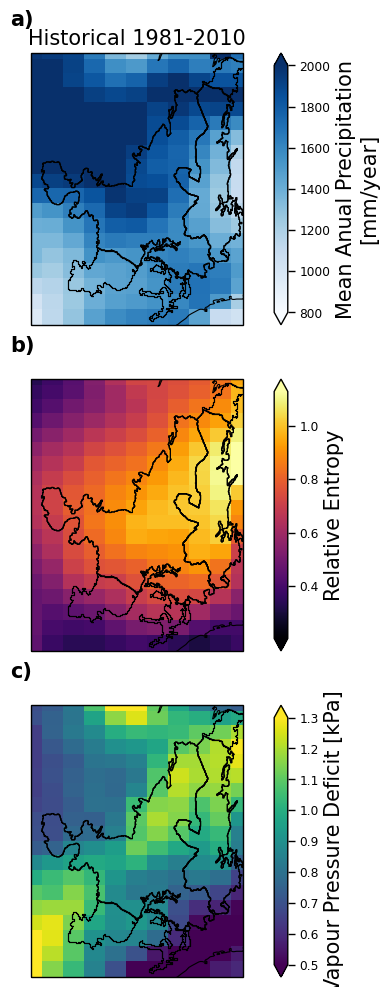

In [34]:
proj_plot = ccrs.Mercator()
fig, ax = plt.subplots(3, 1, figsize=(8, 12), subplot_kw={'projection': proj_plot})

fs= 15
sns.set_context("paper",  rc={"font.size":fs-1,"axes.titlesize":15,"axes.labelsize":fs}) 

ds_historical_pr_clim.pr.plot(ax=ax[0], transform=ccrs.PlateCarree(), vmin=800, vmax=2000, cmap='Blues')

ds_historical_ent_clim.entropy.plot(ax=ax[1], transform=ccrs.PlateCarree(), cmap='inferno', robust=True)

ds_historical_vpd_clim.vpd.plot(ax=ax[2], transform=ccrs.PlateCarree(), cmap='viridis', vmax=1.3, vmin=0.5)



for i in ax.flat:    
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    i.coastlines()
    #set axis extend
    i.set_extent([-61, -42, -25, -2], crs=ccrs.PlateCarree())

#set axis titles
ax[0].set_title('Historical 1981-2010')

#write a), b), c), d) for each plot 
ax[0].text(-0.1, 1.1, 'a)', transform=ax[0].transAxes, size=15, weight='bold')
ax[1].text(-0.1, 1.1, 'b)', transform=ax[1].transAxes, size=15, weight='bold')
ax[2].text(-0.1, 1.1, 'c)', transform=ax[2].transAxes, size=15, weight='bold')

plt.savefig(r'Data\Plots_paper\SI_14fig_cmip_historical.png', dpi=1200, bbox_inches='tight')

### season

In [35]:
#set seasonal climatologies for each variable

#calculate the season mean pr
ds_historical_pr_clim_season = ds_historical_pr.groupby('time.season').mean('time', keep_attrs=True).mean('model', keep_attrs=True)
ds_ssp585_pr_clim_season = ds_ssp585_pr.groupby('time.season').mean('time').mean('model')
ds_ssp245_pr_clim_season = ds_ssp245_pr.groupby('time.season').mean('time').mean('model')

#anomalies
ds_ssp245_pr_anomaly_season = (ds_ssp245_pr_clim_season - ds_historical_pr_clim_season)
ds_ssp585_pr_anomaly_season = (ds_ssp585_pr_clim_season - ds_historical_pr_clim_season)
#calculate the season mean for vpd
ds_historical_vpd_clim_season = ds_historical_vpd.groupby('time.season').mean('time', keep_attrs=True).mean('model', keep_attrs=True)
ds_ssp585_vpd_clim_season = ds_ssp585_vpd.groupby('time.season').mean('time').mean('model')
ds_ssp245_vpd_clim_season = ds_ssp245_vpd.groupby('time.season').mean('time').mean('model')

#anomalies
ds_ssp245_vpd_anomaly_season = (ds_ssp245_vpd_clim_season - ds_historical_vpd_clim_season)
ds_ssp585_vpd_anomaly_season = (ds_ssp585_vpd_clim_season - ds_historical_vpd_clim_season)

#calculate the season mean for hurs
ds_historical_hurs_clim_season = ds_historical_hurs.groupby('time.season').mean('time', keep_attrs=True).mean('model', keep_attrs=True)
ds_ssp245_hurs_anomaly_season = ds_ssp245_hurs.groupby('time.season').mean('time').mean('model')
ds_ssp585_hurs_anomaly_season = ds_ssp585_hurs.groupby('time.season').mean('time').mean('model')

#anomaly
ds_ssp245_hurs_anomaly_season = (ds_ssp245_hurs_anomaly_season - ds_historical_hurs_clim_season)
ds_ssp585_hurs_anomaly_season = (ds_ssp585_hurs_anomaly_season - ds_historical_hurs_clim_season)

#calculate the season mean for tas
ds_historical_tas_clim_season = ds_historical_tas.groupby('time.season').mean('time', keep_attrs=True).mean('model', keep_attrs=True)
ds_ssp245_tas_anomaly_season = ds_ssp245_tas.groupby('time.season').mean('time').mean('model')
ds_ssp585_tas_anomaly_season = ds_ssp585_tas.groupby('time.season').mean('time').mean('model')

#anomaly
ds_ssp245_tas_anomaly_season = (ds_ssp245_tas_anomaly_season - ds_historical_tas_clim_season)
ds_ssp585_tas_anomaly_season = (ds_ssp585_tas_anomaly_season - ds_historical_tas_clim_season)


In [36]:
#set attrs
ds_historical_pr_clim_season.pr.attrs['units'] = 'mm/month'
ds_historical_vpd_clim_season.vpd.attrs['units'] = 'kPa'
ds_historical_hurs_clim_season.hurs.attrs['units'] = '%'
ds_historical_tas_clim_season.tas.attrs['units'] = '°C'



ds_historical_pr_clim_season.pr.attrs['long_name'] = 'Precipitation'
ds_historical_vpd_clim_season.vpd.attrs['long_name'] = 'Vapour Pressure Deficit'
ds_historical_hurs_clim_season.hurs.attrs['long_name'] = 'Relative Humidity'
ds_historical_tas_clim_season.tas.attrs['long_name'] = 'Temperature'

#set name and units for ssps
ds_ssp245_pr_anomaly_season.pr.attrs['units'] = 'mm/month'
ds_ssp585_pr_anomaly_season.pr.attrs['units'] = 'mm/month'
ds_ssp245_vpd_anomaly_season.vpd.attrs['units'] = 'kPa'
ds_ssp585_vpd_anomaly_season.vpd.attrs['units'] = 'kPa'
ds_ssp245_hurs_anomaly_season.hurs.attrs['units'] = '%'
ds_ssp585_hurs_anomaly_season.hurs.attrs['units'] = '%'
ds_ssp245_tas_anomaly_season.tas.attrs['units'] = '°C'
ds_ssp585_tas_anomaly_season.tas.attrs['units'] = '°C'

#set long name for the ds
ds_ssp245_pr_anomaly_season.pr.attrs['long_name'] = 'Precipitation Anomaly'
ds_ssp585_pr_anomaly_season.pr.attrs['long_name'] = 'Precipitation Anomaly'
ds_ssp245_vpd_anomaly_season.vpd.attrs['long_name'] = 'Vapour Pressure Deficit Anomaly'
ds_ssp585_vpd_anomaly_season.vpd.attrs['long_name'] = 'Vapour Pressure Deficit Anomaly'
ds_ssp245_hurs_anomaly_season.hurs.attrs['long_name'] = 'Relative Humidity Anomaly'
ds_ssp585_hurs_anomaly_season.hurs.attrs['long_name'] = 'Relative Humidity Anomaly'
ds_ssp245_tas_anomaly_season.tas.attrs['long_name'] = 'Temperature Anomaly'
ds_ssp585_tas_anomaly_season.tas.attrs['long_name'] = 'Temperature Anomaly'






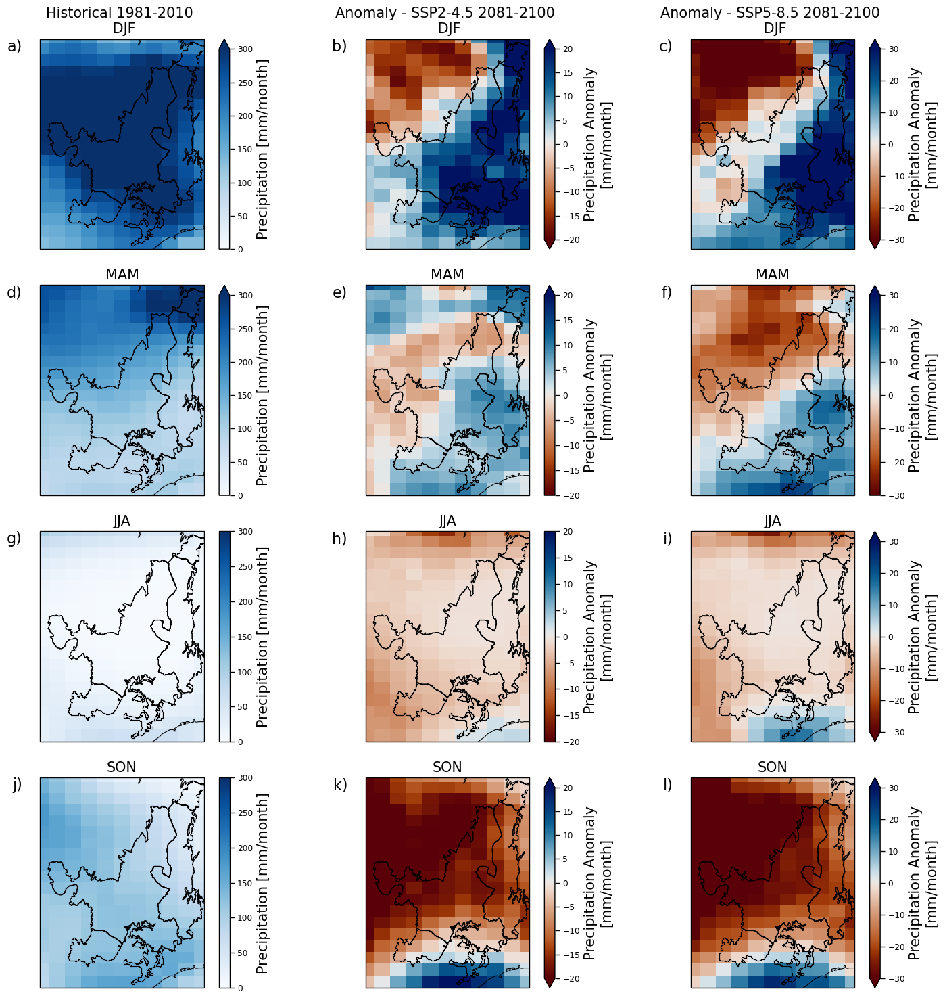

In [37]:
#plot seasonal pr
seasons = ['DJF', 'MAM', 'JJA', 'SON']
fig, ax = plt.subplots(4, 3, subplot_kw={'projection': proj_plot}, figsize=(15,15))

for i, sea in enumerate(seasons):
    ds_historical_pr_clim_season.sel(season=sea).pr.plot(ax=ax[i][0], transform=ccrs.PlateCarree(), cmap='Blues', vmax=300, vmin=0)
    ds_ssp245_pr_anomaly_season.sel(season= sea).pr.plot(ax=ax[i][1], transform=ccrs.PlateCarree(), cmap='cmc.vik_r',vmax=20, vmin=-20)
    ds_ssp585_pr_anomaly_season.sel(season= sea).pr.plot(ax=ax[i][2], transform=ccrs.PlateCarree(), cmap='cmc.vik_r',vmax=30, vmin=-30)
    for j in range(3):
        ax[i][j].set_title(sea)

for i in ax.flat:    
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    i.coastlines()
    #set axis extend
    i.set_extent([-61, -42, -25, -2], crs=ccrs.PlateCarree())

ax[0][0].set_title('Historical 1981-2010 \n DJF')
ax[0][1].set_title('Anomaly - SSP2-4.5 2081-2100 \n DJF')
ax[0][2].set_title('Anomaly - SSP5-8.5 2081-2100 \n DJF') 
ax[1][0].set_title('MAM')
ax[2][0].set_title('JJA')
ax[3][0].set_title('SON')


#write a), b), c), d) for each plot 
ax[0][0].text(-0.11, 1, 'a)', transform=ax[0][0].transAxes, fontsize=16, va='top', ha='right')
ax[0][1].text(-0.11, 1, 'b)', transform=ax[0][1].transAxes, fontsize=16, va='top', ha='right')
ax[0][2].text(-0.11, 1, 'c)', transform=ax[0][2].transAxes, fontsize=16, va='top', ha='right')
ax[1][0].text(-0.11, 1, 'd)', transform=ax[1][0].transAxes, fontsize=16, va='top', ha='right')
ax[1][1].text(-0.11, 1, 'e)', transform=ax[1][1].transAxes, fontsize=16, va='top', ha='right')
ax[1][2].text(-0.11, 1, 'f)', transform=ax[1][2].transAxes, fontsize=16, va='top', ha='right')
ax[2][0].text(-0.11, 1, 'g)', transform=ax[2][0].transAxes, fontsize=16, va='top', ha='right')
ax[2][1].text(-0.11, 1, 'h)', transform=ax[2][1].transAxes, fontsize=16, va='top', ha='right')
ax[2][2].text(-0.11, 1, 'i)', transform=ax[2][2].transAxes, fontsize=16, va='top', ha='right')
ax[3][0].text(-0.11, 1, 'j)', transform=ax[3][0].transAxes, fontsize=16, va='top', ha='right')
ax[3][1].text(-0.11, 1, 'k)', transform=ax[3][1].transAxes, fontsize=16, va='top', ha='right')
ax[3][2].text(-0.11, 1, 'l)', transform=ax[3][2].transAxes, fontsize=16, va='top', ha='right')


plt.tight_layout()

plt.savefig(r'Data\Plots_paper\SI_15fig_cmip_season_pr.png', dpi=1200, bbox_inches='tight')


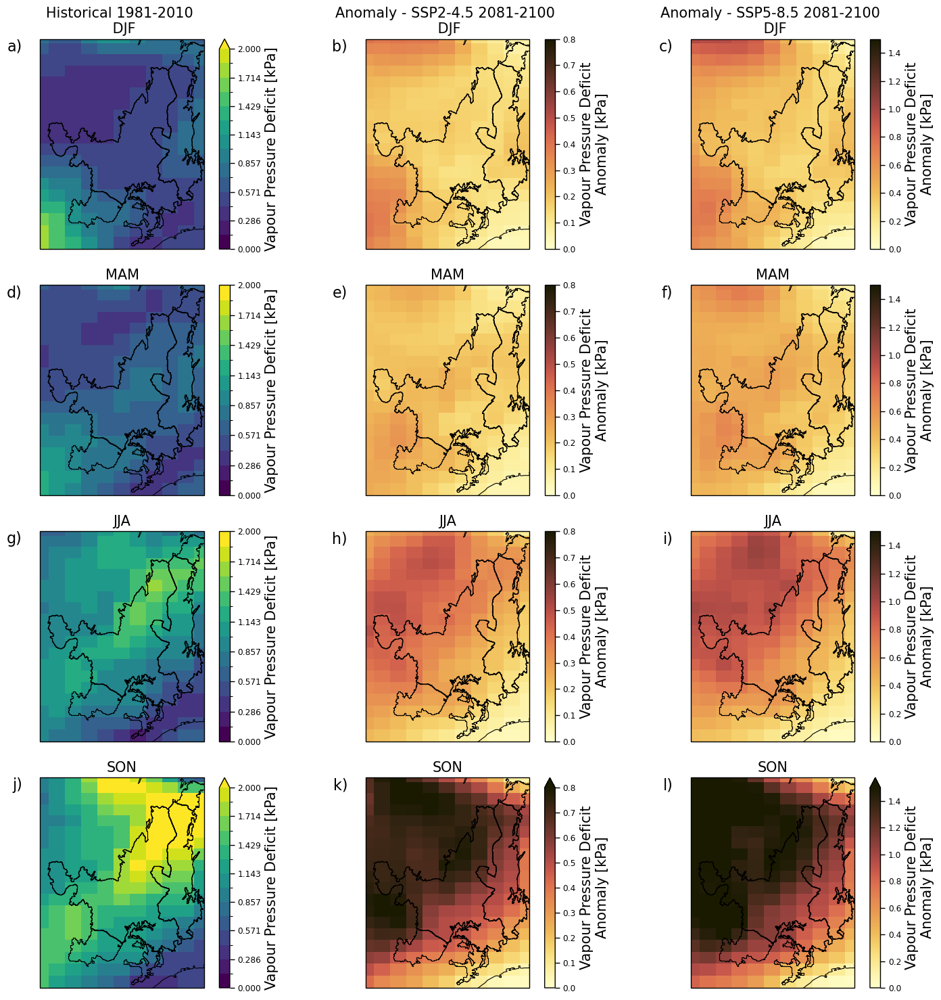

In [38]:
#plot seasonal VPD
seasons = ['DJF', 'MAM', 'JJA', 'SON']
fig, ax = plt.subplots(4, 3, subplot_kw={'projection': proj_plot}, figsize=(15,15))


for i, sea in enumerate(seasons):
    ds_historical_vpd_clim_season.sel(season=sea).vpd.plot(ax=ax[i][0], transform=ccrs.PlateCarree(), cmap='viridis', levels = 15, vmax=2.0, vmin=0)
    ds_ssp245_vpd_anomaly_season.sel(season= sea).vpd.plot(ax=ax[i][1], transform=ccrs.PlateCarree(), cmap='cmc.lajolla', vmin=0, vmax=0.8)
    ds_ssp585_vpd_anomaly_season.sel(season= sea).vpd.plot(ax=ax[i][2], transform=ccrs.PlateCarree(), cmap='cmc.lajolla', vmin=0, vmax=1.5)
    for j in range(3):
        ax[i][j].set_title(sea)
for i in ax.flat:    
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    i.coastlines()
    #set axis extend
    i.set_extent([-61, -42, -25, -2], crs=ccrs.PlateCarree())
    
ax[0][0].set_title('Historical 1981-2010 \n DJF')
ax[0][1].set_title('Anomaly - SSP2-4.5 2081-2100 \n DJF')
ax[0][2].set_title('Anomaly - SSP5-8.5 2081-2100 \n DJF') 
ax[1][0].set_title('MAM')
ax[2][0].set_title('JJA')
ax[3][0].set_title('SON')
#write a), b), c), d) for each plot 
ax[0][0].text(-0.11, 1, 'a)', transform=ax[0][0].transAxes, fontsize=16, va='top', ha='right')
ax[0][1].text(-0.11, 1, 'b)', transform=ax[0][1].transAxes, fontsize=16, va='top', ha='right')
ax[0][2].text(-0.11, 1, 'c)', transform=ax[0][2].transAxes, fontsize=16, va='top', ha='right')
ax[1][0].text(-0.11, 1, 'd)', transform=ax[1][0].transAxes, fontsize=16, va='top', ha='right')
ax[1][1].text(-0.11, 1, 'e)', transform=ax[1][1].transAxes, fontsize=16, va='top', ha='right')
ax[1][2].text(-0.11, 1, 'f)', transform=ax[1][2].transAxes, fontsize=16, va='top', ha='right')
ax[2][0].text(-0.11, 1, 'g)', transform=ax[2][0].transAxes, fontsize=16, va='top', ha='right')
ax[2][1].text(-0.11, 1, 'h)', transform=ax[2][1].transAxes, fontsize=16, va='top', ha='right')
ax[2][2].text(-0.11, 1, 'i)', transform=ax[2][2].transAxes, fontsize=16, va='top', ha='right')
ax[3][0].text(-0.11, 1, 'j)', transform=ax[3][0].transAxes, fontsize=16, va='top', ha='right')
ax[3][1].text(-0.11, 1, 'k)', transform=ax[3][1].transAxes, fontsize=16, va='top', ha='right')
ax[3][2].text(-0.11, 1, 'l)', transform=ax[3][2].transAxes, fontsize=16, va='top', ha='right')


plt.tight_layout()

plt.savefig(r'Data\Plots_paper\SI_16fig_cmip_season_vpd.png', dpi=1200, bbox_inches='tight')

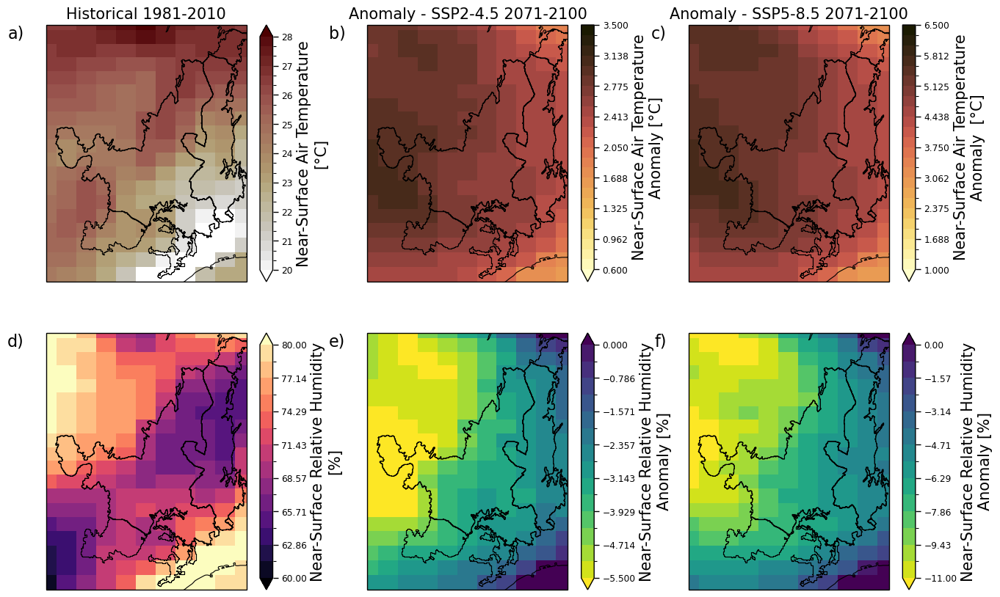

In [39]:
proj_plot = ccrs.Mercator()
fig, ax = plt.subplots(2, 3, figsize=(16, 10), subplot_kw={'projection': proj_plot})


ds_historical_tas_clim.tas.plot(ax=ax[0][0], transform=ccrs.PlateCarree(), vmax=28, vmin=20, cmap='cmc.bilbao', levels = 25)
ds_ssp245_tas_anomaly.tas.plot(ax=ax[0][1], transform=ccrs.PlateCarree(), cmap='cmc.lajolla', levels = 25, vmax=3.5, vmin=0.6)
ds_ssp585_tas_anomaly.tas.plot(ax=ax[0][2], transform=ccrs.PlateCarree(), cmap='cmc.lajolla', levels = 25, vmax=6.5, vmin=1)

ds_historical_hurs_clim.hurs.plot(ax=ax[1][0], transform=ccrs.PlateCarree(), cmap='magma', levels = 15, vmax=80, vmin=60)
ds_ssp245_hurs_anomaly.hurs.plot(ax=ax[1][1], transform=ccrs.PlateCarree(), cmap='viridis_r', levels = 15, vmax=0, vmin=-5.5)
ds_ssp585_hurs_anomaly.hurs.plot(ax=ax[1][2], transform=ccrs.PlateCarree(), cmap='viridis_r', levels = 15, vmax=0, vmin=-11)


for i in ax.flat:    
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    i.coastlines()
    #set axis extend
    i.set_extent([-61, -42, -25, -2], crs=ccrs.PlateCarree())

#set axis titles
ax[0][0].set_title('Historical 1981-2010')
ax[0][1].set_title('Anomaly - SSP2-4.5 2071-2100')
ax[0][2].set_title('Anomaly - SSP5-8.5 2071-2100') 
#write a), b), c), d) for each plot 
ax[0][0].text(-0.11, 1, 'a)', transform=ax[0][0].transAxes, fontsize=16, va='top', ha='right')
ax[0][1].text(-0.11, 1, 'b)', transform=ax[0][1].transAxes, fontsize=16, va='top', ha='right')
ax[0][2].text(-0.11, 1, 'c)', transform=ax[0][2].transAxes, fontsize=16, va='top', ha='right')
ax[1][0].text(-0.11, 1, 'd)', transform=ax[1][0].transAxes, fontsize=16, va='top', ha='right')
ax[1][1].text(-0.11, 1, 'e)', transform=ax[1][1].transAxes, fontsize=16, va='top', ha='right')
ax[1][2].text(-0.11, 1, 'f)', transform=ax[1][2].transAxes, fontsize=16, va='top', ha='right')
plt.savefig(r'Data\Plots_paper\SI_17fig_cmip_temp_rh.png', dpi=1200, bbox_inches='tight')

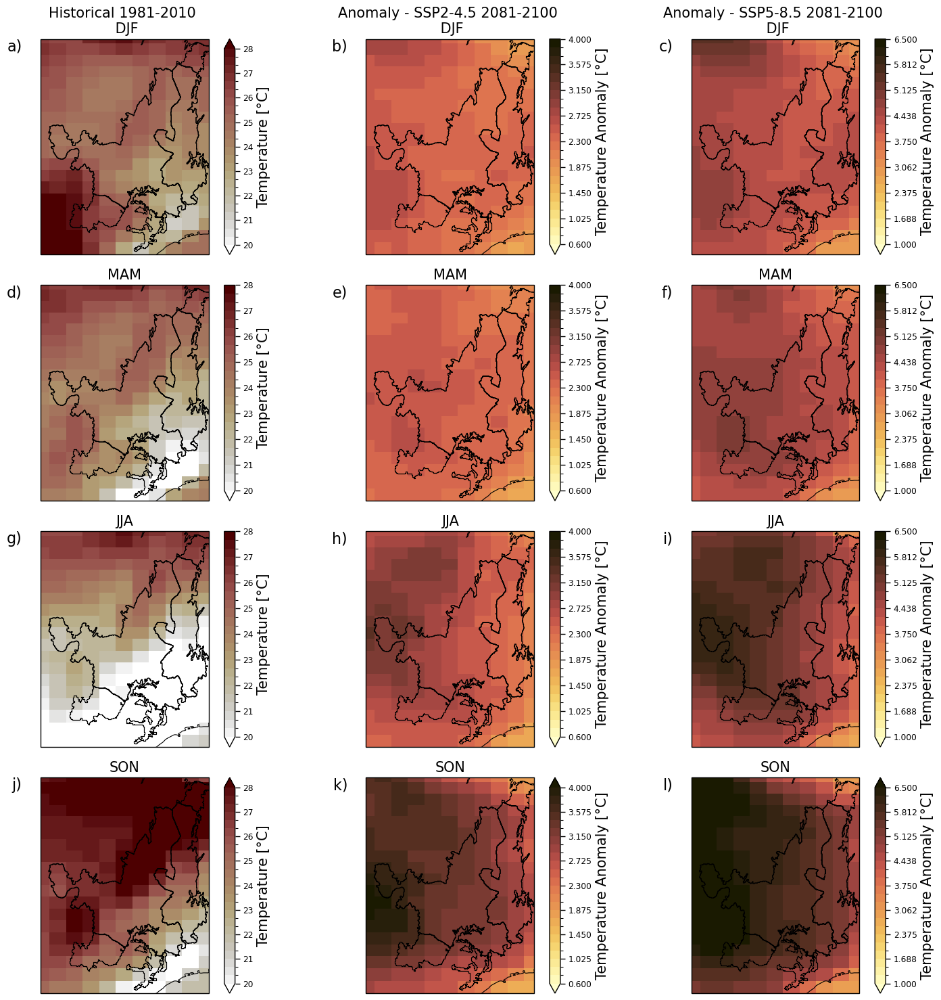

In [40]:
#plot seasonal TAS
seasons = ['DJF', 'MAM', 'JJA', 'SON']
fig, ax = plt.subplots(4, 3, subplot_kw={'projection': proj_plot}, figsize=(15,15))

for i, sea in enumerate(seasons):
    ds_historical_tas_clim_season.sel(season=sea).tas.plot(ax=ax[i][0], transform=ccrs.PlateCarree(), vmax=28, vmin=20, cmap='cmc.bilbao', levels = 25)
    ds_ssp245_tas_anomaly_season.sel(season=sea).tas.plot(ax=ax[i][1], transform=ccrs.PlateCarree(), cmap='cmc.lajolla', levels = 25, vmax=4, vmin=0.6)
    ds_ssp585_tas_anomaly_season.sel(season=sea).tas.plot(ax=ax[i][2], transform=ccrs.PlateCarree(), cmap='cmc.lajolla', levels = 25, vmax=6.5, vmin=1)
    for j in range(3):
        ax[i][j].set_title(sea)

for i in ax.flat:    
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    i.coastlines()
    #set axis extend
    i.set_extent([-61, -42, -25, -2], crs=ccrs.PlateCarree())

ax[0][0].set_title('Historical 1981-2010 \n DJF')
ax[0][1].set_title('Anomaly - SSP2-4.5 2081-2100 \n DJF')
ax[0][2].set_title('Anomaly - SSP5-8.5 2081-2100 \n DJF') 
ax[1][0].set_title('MAM')
ax[2][0].set_title('JJA')
ax[3][0].set_title('SON')
#write a), b), c), d) for each plot 
ax[0][0].text(-0.11, 1, 'a)', transform=ax[0][0].transAxes, fontsize=16, va='top', ha='right')
ax[0][1].text(-0.11, 1, 'b)', transform=ax[0][1].transAxes, fontsize=16, va='top', ha='right')
ax[0][2].text(-0.11, 1, 'c)', transform=ax[0][2].transAxes, fontsize=16, va='top', ha='right')
ax[1][0].text(-0.11, 1, 'd)', transform=ax[1][0].transAxes, fontsize=16, va='top', ha='right')
ax[1][1].text(-0.11, 1, 'e)', transform=ax[1][1].transAxes, fontsize=16, va='top', ha='right')
ax[1][2].text(-0.11, 1, 'f)', transform=ax[1][2].transAxes, fontsize=16, va='top', ha='right')
ax[2][0].text(-0.11, 1, 'g)', transform=ax[2][0].transAxes, fontsize=16, va='top', ha='right')
ax[2][1].text(-0.11, 1, 'h)', transform=ax[2][1].transAxes, fontsize=16, va='top', ha='right')
ax[2][2].text(-0.11, 1, 'i)', transform=ax[2][2].transAxes, fontsize=16, va='top', ha='right')
ax[3][0].text(-0.11, 1, 'j)', transform=ax[3][0].transAxes, fontsize=16, va='top', ha='right')
ax[3][1].text(-0.11, 1, 'k)', transform=ax[3][1].transAxes, fontsize=16, va='top', ha='right')
ax[3][2].text(-0.11, 1, 'l)', transform=ax[3][2].transAxes, fontsize=16, va='top', ha='right')


plt.tight_layout()

plt.savefig(r'Data\Plots_paper\SI_18fig_cmip_season_temp.png', dpi=1200, bbox_inches='tight')

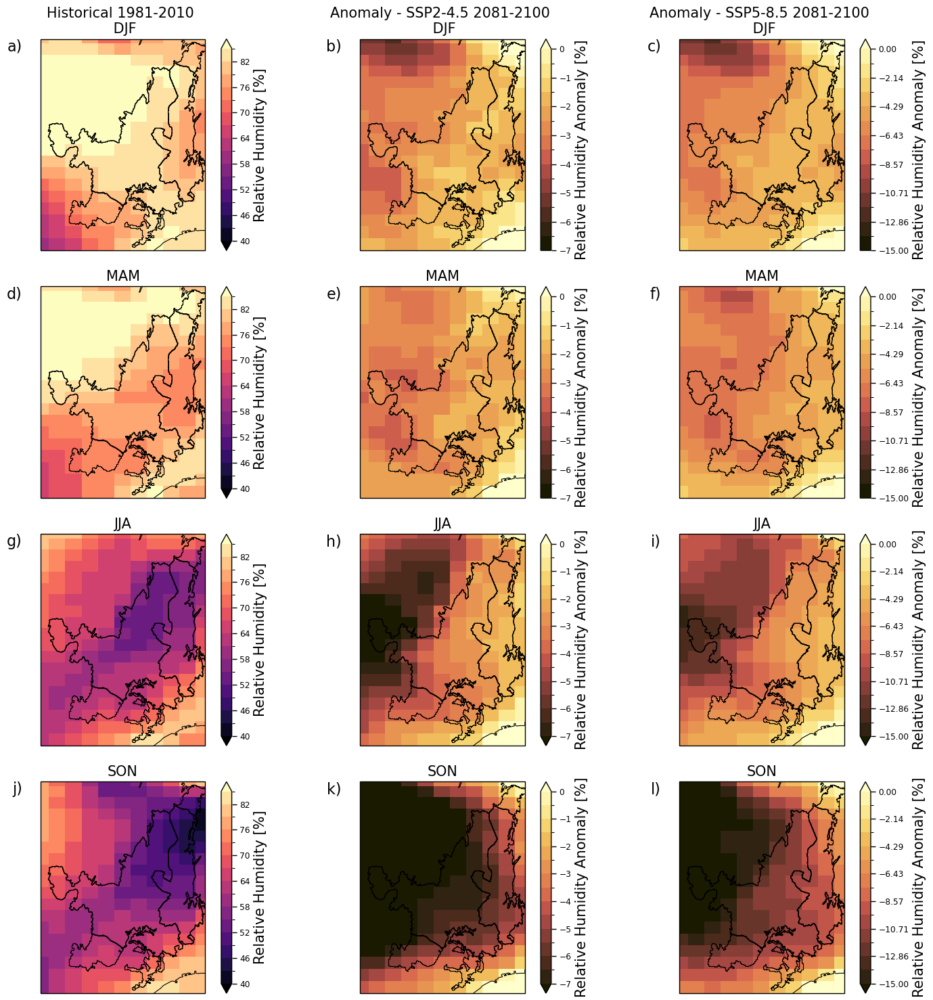

In [41]:
#plot seasonal RH
seasons = ['DJF', 'MAM', 'JJA', 'SON']
fig, ax = plt.subplots(4, 3, subplot_kw={'projection': proj_plot}, figsize=(15,15))


for i, sea in enumerate(seasons):
    ds_historical_hurs_clim_season.sel(season=sea).hurs.plot(ax=ax[i][0], transform=ccrs.PlateCarree(), cmap='magma', levels = 16, vmax=85, vmin=40)
    ds_ssp245_hurs_anomaly_season.sel(season=sea).hurs.plot(ax=ax[i][1], transform=ccrs.PlateCarree(), cmap='cmc.lajolla_r', levels = 15, vmax=0, vmin=-7)
    ds_ssp585_hurs_anomaly_season.sel(season=sea).hurs.plot(ax=ax[i][2], transform=ccrs.PlateCarree(), cmap='cmc.lajolla_r', levels = 15, vmax=0, vmin=-15)
    for j in range(3):
        ax[i][j].set_title(sea)

for i in ax.flat:    
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    regions.plot(ax=i, transform=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    i.coastlines()
    #set axis extend
    i.set_extent([-61, -42, -25, -2], crs=ccrs.PlateCarree())
ax[0][0].set_title('Historical 1981-2010 \n DJF')
ax[0][1].set_title('Anomaly - SSP2-4.5 2081-2100 \n DJF')
ax[0][2].set_title('Anomaly - SSP5-8.5 2081-2100 \n DJF') 
ax[1][0].set_title('MAM')
ax[2][0].set_title('JJA')
ax[3][0].set_title('SON')
#write a), b), c), d) for each plot 
ax[0][0].text(-0.11, 1, 'a)', transform=ax[0][0].transAxes, fontsize=16, va='top', ha='right')
ax[0][1].text(-0.11, 1, 'b)', transform=ax[0][1].transAxes, fontsize=16, va='top', ha='right')
ax[0][2].text(-0.11, 1, 'c)', transform=ax[0][2].transAxes, fontsize=16, va='top', ha='right')
ax[1][0].text(-0.11, 1, 'd)', transform=ax[1][0].transAxes, fontsize=16, va='top', ha='right')
ax[1][1].text(-0.11, 1, 'e)', transform=ax[1][1].transAxes, fontsize=16, va='top', ha='right')
ax[1][2].text(-0.11, 1, 'f)', transform=ax[1][2].transAxes, fontsize=16, va='top', ha='right')
ax[2][0].text(-0.11, 1, 'g)', transform=ax[2][0].transAxes, fontsize=16, va='top', ha='right')
ax[2][1].text(-0.11, 1, 'h)', transform=ax[2][1].transAxes, fontsize=16, va='top', ha='right')
ax[2][2].text(-0.11, 1, 'i)', transform=ax[2][2].transAxes, fontsize=16, va='top', ha='right')
ax[3][0].text(-0.11, 1, 'j)', transform=ax[3][0].transAxes, fontsize=16, va='top', ha='right')
ax[3][1].text(-0.11, 1, 'k)', transform=ax[3][1].transAxes, fontsize=16, va='top', ha='right')
ax[3][2].text(-0.11, 1, 'l)', transform=ax[3][2].transAxes, fontsize=16, va='top', ha='right')


plt.tight_layout()

plt.savefig(r'Data\Plots_paper\SI_19fig_cmip_season_rh.png', dpi=1200, bbox_inches='tight')

### timeseries

In [42]:
#open and set up data
df_pr = pd.read_csv((r'Data\CMIP6\timeseries\df_pr_ts_year_10_bests.csv'))
df_ent = pd.read_csv((r'Data\CMIP6\timeseries\df_ent_ts_year_10_bests.csv'))
df_tas = pd.read_csv((r'Data\CMIP6\timeseries\df_tas_ts_year_10_bests.csv'))
df_vpd = pd.read_csv((r'Data\CMIP6\timeseries\df_vpd_ts_year_10_bests.csv'))
df_hurs = pd.read_csv((r'Data\CMIP6\timeseries\df_hurs_ts_year_10_bests.csv'))
#get only data after 1940
df_pr = df_pr[df_pr['year'] >= 1940]
df_tas = df_tas[df_tas['year'] >= 1940]
df_hurs = df_hurs[df_hurs['year'] >= 1940]
df_vpd = df_vpd[df_vpd['year'] >= 1940]
df_ent = df_ent[df_ent['year'] >= 1940]

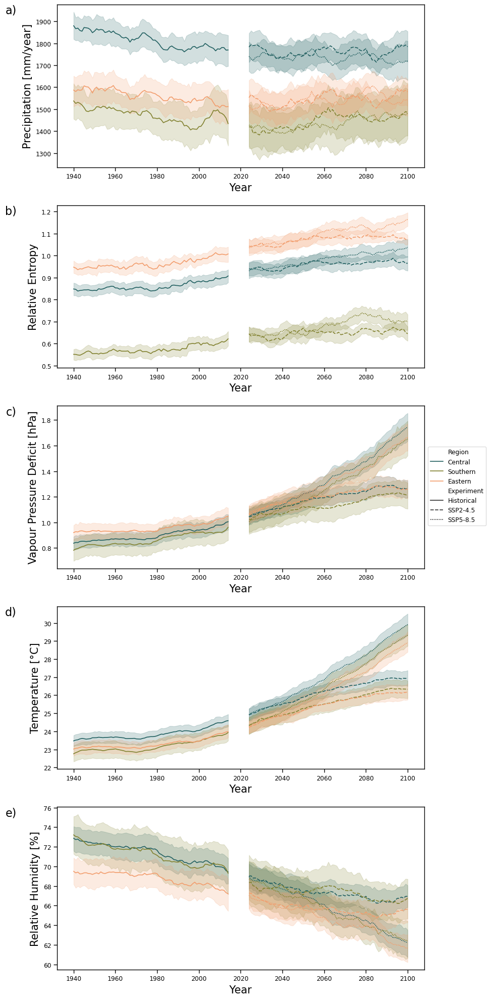

In [43]:
#plot annual
fig, ax = plt.subplots(5,1, figsize=(10,20))

sns.lineplot(data=df_pr, x='year', y='pr', hue='Region', ax=ax[0], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_ent, x='year', y='entropy', hue='Region', ax=ax[1], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_vpd, x='year', y='vpd', hue='Region', ax=ax[2], palette=palette, errorbar=('ci', 60), style='Experiment', legend=True, hue_order = hue_order)
sns.lineplot(data=df_tas, x='year', y='tas', hue='Region', ax=ax[3], palette=palette, errorbar=('ci', 60), style='Experiment',legend=False, hue_order = hue_order)
sns.lineplot(data=df_hurs, x='year', y='hurs', hue='Region', ax=ax[4], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
# legend outside of plot
ax[2].legend(bbox_to_anchor=(1.01, 0.75), loc=2, borderaxespad=0.)
#set axis labels
ax[0].set_ylabel('Precipitation [mm/year]')
ax[1].set_ylabel('Relative Entropy')
ax[2].set_ylabel('Vapour Pressure Deficit [hPa]')
ax[3].set_ylabel('Temperature [°C]')
ax[4].set_ylabel('Relative Humidity [%]')
#set x labels to Year for all plots
for i in ax.flat:
    i.set_xlabel('Year')
    
#write a), b), c), d) for each plot 
ax[0].text(-0.11, 1, 'a)', transform=ax[0].transAxes, fontsize=16, va='top', ha='right')
ax[1].text(-0.11, 1, 'b)', transform=ax[1].transAxes, fontsize=16, va='top', ha='right')
ax[2].text(-0.11, 1, 'c)', transform=ax[2].transAxes, fontsize=16, va='top', ha='right')
ax[3].text(-0.11, 1, 'd)', transform=ax[3].transAxes, fontsize=16, va='top', ha='right')
ax[4].text(-0.11, 1, 'e)', transform=ax[4].transAxes, fontsize=16, va='top', ha='right')


plt.tight_layout()

plt.savefig(r'Data\Plots_paper\SI_20_fig_cmip_ts_anual.png', dpi=1200, bbox_inches='tight')

#### season

In [44]:
#set data
df_pr_season = pd.read_csv(r'Data\CMIP6\timeseries\df_pr_ts_season_10_bests.csv')
df_tas_season = pd.read_csv(r'Data\CMIP6\timeseries\df_tas_ts_season_10_bests.csv')
df_hurs_season = pd.read_csv(r'Data\CMIP6\timeseries\df_hurs_ts_season_10_bests.csv')
df_vpd_season = pd.read_csv(r'Data\CMIP6\timeseries\df_vpd_ts_season_10_bests.csv')

# get only data after 1940
df_pr_season = df_pr_season[df_pr_season['year'] >= 1940]
df_tas_season = df_tas_season[df_tas_season['year'] >= 1940]
df_hurs_season = df_hurs_season[df_hurs_season['year'] >= 1940]
df_vpd_season = df_vpd_season[df_vpd_season['year'] >= 1940]

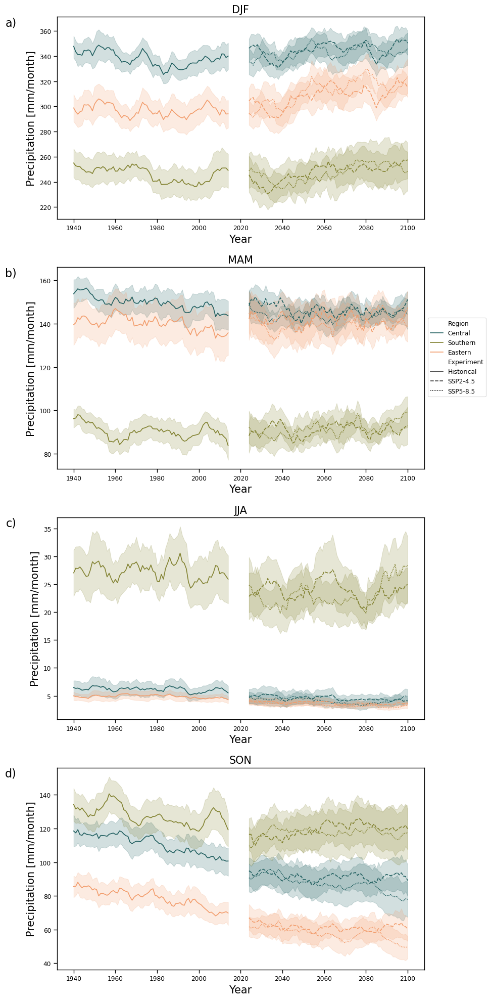

In [45]:
# plot time series for each season
fig, ax = plt.subplots(4,1, figsize=(10,20))
sns.lineplot(data=df_pr_season[df_pr_season['season']=='DJF'], x='year', y='pr', hue='Region', ax=ax[0], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_pr_season[df_pr_season['season']=='MAM'], x='year', y='pr', hue='Region', ax=ax[1], palette=palette, errorbar=('ci', 60), style='Experiment', legend=True, hue_order = hue_order)
sns.lineplot(data=df_pr_season[df_pr_season['season']=='JJA'], x='year', y='pr', hue='Region', ax=ax[2], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_pr_season[df_pr_season['season']=='SON'], x='year', y='pr', hue='Region', ax=ax[3], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
ax[0].title.set_text('DJF')
ax[1].title.set_text('MAM')
ax[2].title.set_text('JJA')
ax[3].title.set_text('SON')

for i in ax.flat:
    i.set_xlabel('Year')
    i.set_ylabel('Precipitation [mm/month]')

ax[1].legend(bbox_to_anchor=(1.01, 0.75), loc=2, borderaxespad=0.)

#write a), b), c), d) for each plot 
ax[0].text(-0.11, 1, 'a)', transform=ax[0].transAxes, fontsize=16, va='top', ha='right')
ax[1].text(-0.11, 1, 'b)', transform=ax[1].transAxes, fontsize=16, va='top', ha='right')
ax[2].text(-0.11, 1, 'c)', transform=ax[2].transAxes, fontsize=16, va='top', ha='right')
ax[3].text(-0.11, 1, 'd)', transform=ax[3].transAxes, fontsize=16, va='top', ha='right')


plt.tight_layout()

plt.savefig(r'Data\Plots_paper\SI_21_fig_cmip_ts_season_pr.png', dpi=1200, bbox_inches='tight')

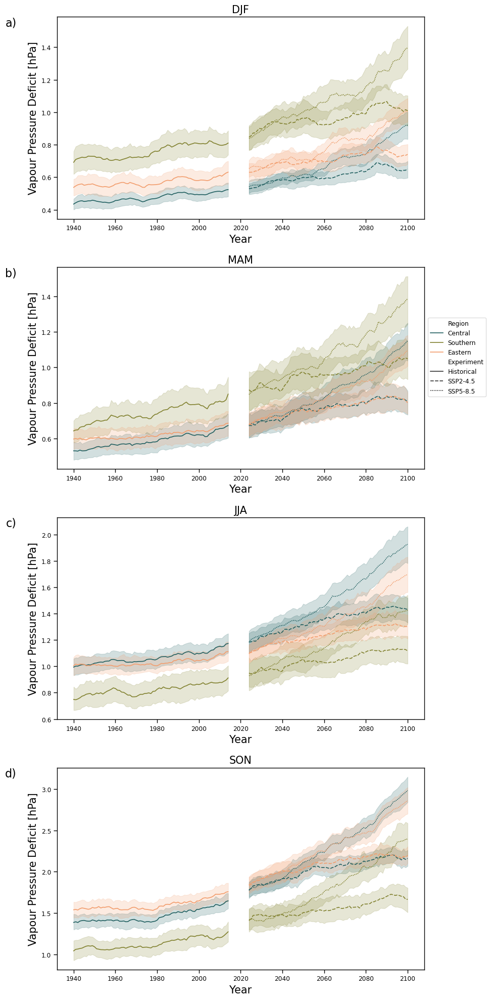

In [46]:
fig, ax = plt.subplots(4,1,  figsize=(10,20))
sns.lineplot(data=df_vpd_season[df_vpd_season['season']=='DJF'], x='year', y='vpd', hue='Region', ax=ax[0], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_vpd_season[df_vpd_season['season']=='MAM'], x='year', y='vpd', hue='Region', ax=ax[1], palette=palette, errorbar=('ci', 60), style='Experiment', legend=True, hue_order = hue_order)
sns.lineplot(data=df_vpd_season[df_vpd_season['season']=='JJA'], x='year', y='vpd', hue='Region', ax=ax[2], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_vpd_season[df_vpd_season['season']=='SON'], x='year', y='vpd', hue='Region', ax=ax[3], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
ax[0].title.set_text('DJF')
ax[1].title.set_text('MAM')
ax[2].title.set_text('JJA')
ax[3].title.set_text('SON')

for i in ax.flat:
    i.set_xlabel('Year')
    i.set_ylabel('Vapour Pressure Deficit [hPa]')

ax[1].legend(bbox_to_anchor=(1.01, 0.75), loc=2, borderaxespad=0.)

#write a), b), c), d) for each plot 
ax[0].text(-0.11, 1, 'a)', transform=ax[0].transAxes, fontsize=16, va='top', ha='right')
ax[1].text(-0.11, 1, 'b)', transform=ax[1].transAxes, fontsize=16, va='top', ha='right')
ax[2].text(-0.11, 1, 'c)', transform=ax[2].transAxes, fontsize=16, va='top', ha='right')
ax[3].text(-0.11, 1, 'd)', transform=ax[3].transAxes, fontsize=16, va='top', ha='right')


plt.tight_layout()

plt.savefig(r'Data\Plots_paper\SI_22_fig_cmip_ts_season_vpd.png', dpi=1200, bbox_inches='tight')


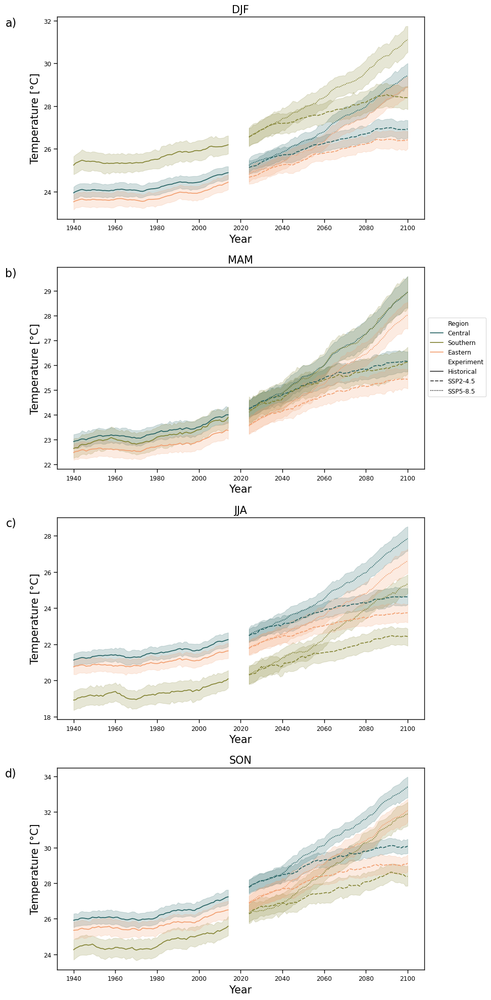

In [47]:
# plot time series for each season
fig, ax = plt.subplots(4,1, figsize=(10,20))
sns.lineplot(data=df_tas_season[df_tas_season['season']=='DJF'], x='year', y='tas', hue='Region', ax=ax[0], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_tas_season[df_tas_season['season']=='MAM'], x='year', y='tas', hue='Region', ax=ax[1], palette=palette, errorbar=('ci', 60), style='Experiment', legend=True , hue_order = hue_order)
sns.lineplot(data=df_tas_season[df_tas_season['season']=='JJA'], x='year', y='tas', hue='Region', ax=ax[2], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_tas_season[df_tas_season['season']=='SON'], x='year', y='tas', hue='Region', ax=ax[3], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
ax[0].title.set_text('DJF')
ax[1].title.set_text('MAM')
ax[2].title.set_text('JJA')
ax[3].title.set_text('SON')

for i in ax.flat:
    i.set_xlabel('Year')
    i.set_ylabel('Temperature [°C]')

ax[1].legend(bbox_to_anchor=(1.01, 0.75), loc=2, borderaxespad=0.)

#write a), b), c), d) for each plot 
ax[0].text(-0.11, 1, 'a)', transform=ax[0].transAxes, fontsize=16, va='top', ha='right')
ax[1].text(-0.11, 1, 'b)', transform=ax[1].transAxes, fontsize=16, va='top', ha='right')
ax[2].text(-0.11, 1, 'c)', transform=ax[2].transAxes, fontsize=16, va='top', ha='right')
ax[3].text(-0.11, 1, 'd)', transform=ax[3].transAxes, fontsize=16, va='top', ha='right')


plt.tight_layout()

plt.savefig(r'Data\Plots_paper\SI_23_fig__cmip_ts_season_temp.png', dpi=1200, bbox_inches='tight')

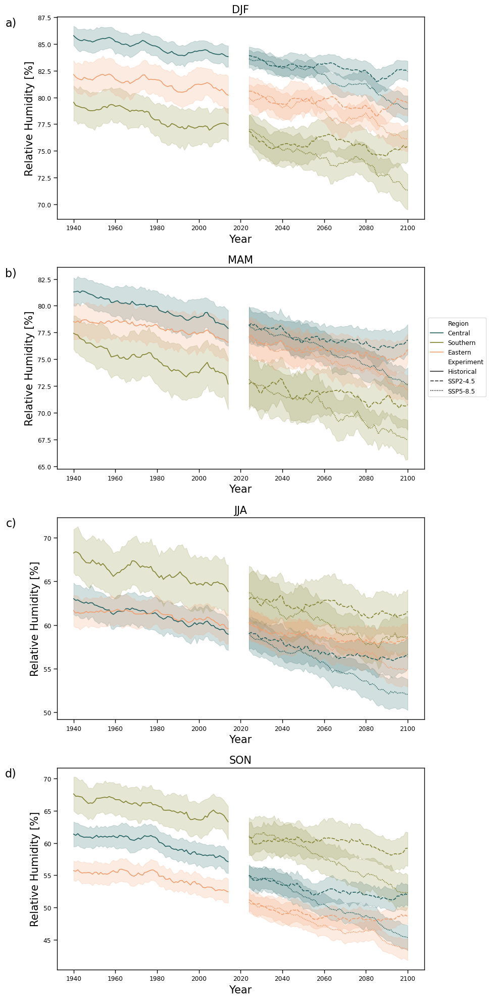

In [48]:
fig, ax = plt.subplots(4,1, figsize=(10,20))
sns.lineplot(data=df_hurs_season[df_hurs_season['season']=='DJF'], x='year', y='hurs', hue='Region', ax=ax[0], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_hurs_season[df_hurs_season['season']=='MAM'], x='year', y='hurs', hue='Region', ax=ax[1], palette=palette, errorbar=('ci', 60), style='Experiment', legend=True , hue_order = hue_order)
sns.lineplot(data=df_hurs_season[df_hurs_season['season']=='JJA'], x='year', y='hurs', hue='Region', ax=ax[2], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
sns.lineplot(data=df_hurs_season[df_hurs_season['season']=='SON'], x='year', y='hurs', hue='Region', ax=ax[3], palette=palette, errorbar=('ci', 60), style='Experiment', legend=False, hue_order = hue_order)
ax[0].title.set_text('DJF')
ax[1].title.set_text('MAM')
ax[2].title.set_text('JJA')
ax[3].title.set_text('SON')

for i in ax.flat:
    i.set_xlabel('Year')
    i.set_ylabel('Relative Humidity [%]')

ax[1].legend(bbox_to_anchor=(1.01, 0.75), loc=2, borderaxespad=0.)

#write a), b), c), d) for each plot 
ax[0].text(-0.11, 1, 'a)', transform=ax[0].transAxes, fontsize=16, va='top', ha='right')
ax[1].text(-0.11, 1, 'b)', transform=ax[1].transAxes, fontsize=16, va='top', ha='right')
ax[2].text(-0.11, 1, 'c)', transform=ax[2].transAxes, fontsize=16, va='top', ha='right')
ax[3].text(-0.11, 1, 'd)', transform=ax[3].transAxes, fontsize=16, va='top', ha='right')


plt.tight_layout()

plt.savefig(r'Data\Plots_paper\SI_24_fig_cmip_ts_season_rh.png', dpi=1200, bbox_inches='tight')

# stats

In [61]:
df_trends_pr = pd.read_csv(r'Data\tendency\df_trends_pr.csv', index_col=0)
df_trends_ent = pd.read_csv(r'Data\tendency\df_trends_ent.csv', index_col=0)
df_trends_vpd = pd.read_csv(r'Data\tendency\df_trends_vpd.csv', index_col=0)

## climatology

In [62]:
gdf_knn['dry_precip_month'] = gdf_knn['dry_precip']/ gdf_knn['dsl']
medias = gdf_knn.groupby('region')[['MAP', 'Entropy','dsl','dry_precip', 'dry_precip_month']].mean().round(2)
medias_inmet = gdf_inmet_clim.groupby('region').mean().round(2)
#merge medias and medias_inmet
medias = medias.merge(medias_inmet, on='region')
medias['MAP'] = medias['MAP'].round(0)
medias[['MAP', 'Entropy', 'VPD','dsl', 'dry_precip', 'dry_precip_month',
       'Temp_min',  'Temp_max', 'RH_max', 'RH_min']]

C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\3876627186.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  medias_inmet = gdf_inmet_clim.groupby('region').mean().round(2)


,MAP,Entropy,VPD,dsl,dry_precip,dry_precip_month,Temp_min,Temp_max,RH_max,RH_min
region,,,,,,,,,,
Central,1502.0,0.56,1.24,6.35,184.49,29.00,22.65,29.44,80.55,54.31
Eastern,1031.0,0.69,1.41,8.04,199.56,24.90,22.98,29.59,75.74,50.61
Southern,1400.0,0.30,1.07,6.32,260.50,41.39,20.41,27.00,80.00,55.07


## signicant trends


In [63]:
#takeout no trend rows from df_trends_vpd
df_trends_vpd = df_trends_vpd[df_trends_vpd['Trend'] != 'no trend']
df_trends_vpd_table = df_trends_vpd.sort_values(by=['Period', 'region','Trend']).pivot(index='region', columns=['Period', 'Trend'], values='Percentage')
#replace nan for 0, and round numbers to 2 decimals
df_trends_vpd_table = df_trends_vpd_table.fillna(0).round(4)
df_trends_vpd_table['Variable'] = 'VPD'
#transform region column into one column per region
df_trends_pr_table = df_trends_pr.sort_values(by=['Period', 'region','Trend']).pivot(index='region', columns=['Period', 'Trend'], values='Percentage')
#replace nan for 0, and round numbers to 2 decimals
df_trends_pr_table = df_trends_pr_table.fillna(0).round(4)
df_trends_pr_table['Variable'] = 'Precipitation'

df_trends_ent['Period'] = 'Anual'
#ad rows for deacrising trend
df_trends_ent = df_trends_ent.append({'region': 'Central', 'Trend': 'decreasing', 'Percentage': 0, 'Period': 'Anual'}, ignore_index=True)
df_trends_ent = df_trends_ent.append({'region': 'Eastern', 'Trend': 'decreasing', 'Percentage': 0, 'Period': 'Anual'}, ignore_index=True)
df_trends_ent = df_trends_ent.append({'region': 'Southern', 'Trend': 'decreasing', 'Percentage': 0, 'Period': 'Anual'}, ignore_index=True)
df_trends_ent = df_trends_ent.append({'region': 'All', 'Trend': 'decreasing', 'Percentage': 0, 'Period': 'Anual'}, ignore_index=True)

df_trends_ent_table = df_trends_ent.sort_values(by=[ 'region','Trend']).pivot(index='region', columns=['Period', 'Trend'], values='Percentage')
#replace nan for 0, and round numbers to 2 decimals
df_trends_ent_table = df_trends_ent_table.fillna(0).round(4)
df_trends_ent_table['Variable'] = 'RE'

#CONCAT pr and vpd trends
df_trends_table = pd.concat([df_trends_pr_table, df_trends_vpd_table, df_trends_ent_table])
df_trends_table = df_trends_table.reset_index().set_index(['Variable', 'region'])


C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\741685921.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_trends_ent = df_trends_ent.append({'region': 'Central', 'Trend': 'decreasing', 'Percentage': 0, 'Period': 'Anual'}, ignore_index=True)
C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\741685921.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_trends_ent = df_trends_ent.append({'region': 'Eastern', 'Trend': 'decreasing', 'Percentage': 0, 'Period': 'Anual'}, ignore_index=True)
C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\741685921.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_trends_ent = df_trends_ent.append({'region': 'Southern', 'Trend': 'decreasing', 'Percentage': 0, 'Period': 'Anual'}, i

In [65]:
df_trends_table

Period                      Anual                   DJF                   JJA  \
Trend                  decreasing increasing decreasing increasing decreasing   
Variable      region                                                            
Precipitation All          3.9749     1.2552     1.0460     5.2301    16.5272   
              Central      4.1353     1.5038     1.1278     4.5113    22.5564   
              Eastern      1.2658     1.2658     2.5316     1.2658    24.0506   
              Southern     5.2632     0.7519     0.0000     9.0226     0.0000   
VPD           All          3.0612    57.1429     6.1224    29.5918     3.0612   
              Central      5.8824    56.8627     9.8039    29.4118     5.8824   
              Eastern      0.0000    60.6061     3.0303    33.3333     0.0000   
              Southern     0.0000    50.0000     0.0000    25.0000     0.0000   
RE            All          0.0000     6.9038        NaN        NaN        NaN   
              Central      0.0000    10.9023        NaN        NaN        NaN   
              Eastern      0.0000     0.0000        NaN        NaN        NaN   
              Southern     0.0000     3.0075        NaN        NaN        NaN   

Period                                   MAM                   SON             
Trend                  increasing decreasing increasing decreasing increasing  
Variable      region                                                           
Precipitation All          0.0000    10.8787     0.2092     1.8828     0.4184  
              Central      0.0000     6.3910     0.3759     3.0075     0.3759  
              Eastern      0.0000     0.0000     0.0000     0.0000     1.2658  
              Southern     0.0000    26.3158     0.0000     0.7519     0.0000  
VPD           All         48.9796     4.0816    26.5306     1.0204    45.9184  
              Central     49.0196     3.9216    29.4118     1.9608    50.9804  
              Eastern     54.5455     6.0606    21.2121     0.0000    45.4545  
              Southern    33.3333     0.0000    33.3333     0.0000    25.0000  
RE            All             NaN        NaN        NaN        NaN        NaN  
              Central         NaN        NaN        NaN        NaN        NaN  
              Eastern         NaN        NaN        NaN        NaN        NaN  
              Southern        NaN        NaN        NaN        NaN        NaN

### ratio and slope

In [35]:
df_ratio_pr = gdf_mk_pr_ent.groupby('region').mean()[['pr_ratio_anual', 'pr_ratio_DJF', 'pr_ratio_MAM', 'pr_ratio_JJA', 'pr_ratio_SON']].round(4).reset_index()
df_ratio_pr['Variable'] = 'Precipitation'
#change the name of the columns to anual, DJF etc
df_ratio_pr = df_ratio_pr.rename(columns={'pr_ratio_anual': 'Anual', 'pr_ratio_DJF': 'DJF', 'pr_ratio_MAM': 'MAM', 'pr_ratio_JJA': 'JJA', 'pr_ratio_SON': 'SON'})
#do it for vpd
df_ratio_vpd = gdf_mk_vpd.groupby('region').mean()[['VPD_ratio_anual', 'VPD_ratio_DJF', 'VPD_ratio_MAM', 'VPD_ratio_JJA', 'VPD_ratio_SON']].round(4).reset_index()
df_ratio_vpd['Variable'] = 'VPD'
df_ratio_vpd = df_ratio_vpd.rename(columns={'VPD_ratio_anual': 'Anual', 'VPD_ratio_DJF': 'DJF', 'VPD_ratio_MAM': 'MAM', 'VPD_ratio_JJA': 'JJA', 'VPD_ratio_SON': 'SON'})
#do it for entropy
df_ratio_ent = gdf_mk_pr_ent.groupby('region').mean()[['ent_ratio']].round(4).reset_index()
df_ratio_ent['Variable'] = 'RE'
df_ratio_ent.rename(columns={'ent_ratio': 'Anual'}, inplace=True)

#concatenate the three dataframes
df_ratio = pd.concat([df_ratio_pr, df_ratio_vpd, df_ratio_ent], ignore_index=True)
df_ratio.round(2) #= df_ratio.set_index(['Variable', 'region'])

C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\2652741349.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ratio_pr = gdf_mk_pr_ent.groupby('region').mean()[['pr_ratio_anual', 'pr_ratio_DJF', 'pr_ratio_MAM', 'pr_ratio_JJA', 'pr_ratio_SON']].round(4).reset_index()
C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\2652741349.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ratio_vpd = gdf_mk_vpd.groupby('region').mean()[['VPD_ratio_anual', 'VPD_ratio_DJF', 'VPD_ratio_MAM', 'VPD_ratio_JJA', 'VPD_ratio_SON']].round(4).reset_index()
C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\2652741349.py:10: 

,region,Anual,DJF,MAM,JJA,SON,Variable
0,Central,-0.07,0.18,-0.31,-1.76,-0.17,Precipitation
1,Eastern,0.04,0.09,0.19,-1.53,0.28,Precipitation
2,Southern,-0.12,0.50,-1.02,-0.22,-0.15,Precipitation
3,Central,1.01,0.70,0.72,1.00,1.24,VPD
4,Eastern,0.85,0.88,0.75,0.74,1.09,VPD
5,Southern,1.08,0.98,1.49,1.24,1.08,VPD
6,Central,0.49,NaN,NaN,NaN,NaN,RE
7,Eastern,-0.07,NaN,NaN,NaN,NaN,RE
8,Southern,0.52,NaN,NaN,NaN,NaN,RE


In [36]:
df_slope_pr = gdf_mk_pr_ent.groupby('region').mean()[['slope_anual', 'slope_DJF', 'slope_MAM', 'slope_JJA', 'slope_SON']].round(3).reset_index()
df_slope_pr['Variable'] = 'Precipitation'
#change the name of the columns to anual, DJF etc
df_slope_pr = df_slope_pr.rename(columns={'slope_anual': 'Anual', 'slope_DJF': 'DJF', 'slope_MAM': 'MAM', 'slope_JJA': 'JJA', 'slope_SON': 'SON'})
#do it for vpd
df_slope_vpd = gdf_mk_vpd.groupby('region').mean()[['slope_anual', 'slope_DJF', 'slope_MAM', 'slope_JJA', 'slope_SON']].round(3).reset_index()
df_slope_vpd['Variable'] = 'VPD'
df_slope_vpd = df_slope_vpd.rename(columns={'slope_anual': 'Anual', 'slope_DJF': 'DJF', 'slope_MAM': 'MAM', 'slope_JJA': 'JJA', 'slope_SON': 'SON'})
#do it for entropy
df_slope_ent = gdf_mk_pr_ent.groupby('region').mean()[['slope_ent']].round(4).reset_index()
df_slope_ent['Variable'] = 'RE'
df_slope_ent.rename(columns={'slope_ent': 'Anual'}, inplace=True)

#concatenate the three dataframes
df_slope = pd.concat([df_slope_pr, df_slope_vpd, df_slope_ent], ignore_index=True)
df_slope# = df_slope.set_index(['Variable', 'region'])

C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\294545885.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_slope_pr = gdf_mk_pr_ent.groupby('region').mean()[['slope_anual', 'slope_DJF', 'slope_MAM', 'slope_JJA', 'slope_SON']].round(3).reset_index()
C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\294545885.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_slope_vpd = gdf_mk_vpd.groupby('region').mean()[['slope_anual', 'slope_DJF', 'slope_MAM', 'slope_JJA', 'slope_SON']].round(3).reset_index()
C:\Users\luisg\AppData\Local\Temp\ipykernel_4372\294545885.py:10: FutureWarning: The default value of nu

,region,Anual,DJF,MAM,JJA,SON,Variable
0,Central,-1.5680,0.295,-0.408,-0.167,-0.243,Precipitation
1,Eastern,-0.2360,-0.007,0.061,-0.035,0.167,Precipitation
2,Southern,-2.0830,0.978,-1.210,-0.082,-0.193,Precipitation
3,Central,0.0100,0.005,0.006,0.012,0.015,VPD
4,Eastern,0.0100,0.007,0.007,0.009,0.015,VPD
5,Southern,0.0100,0.008,0.011,0.012,0.011,VPD
6,Central,0.0030,NaN,NaN,NaN,NaN,RE
7,Eastern,-0.0008,NaN,NaN,NaN,NaN,RE
8,Southern,0.0025,NaN,NaN,NaN,NaN,RE


In [45]:
#do a for lopp in df_trend that appends to each cell the value of the df_cmip6
df_ratio = df_ratio.round(2)
df_trend = df_slope.copy()
for i in range(0, len(df_trend)):
    for j in range(0, len(df_trend.columns)):
        if j != 0:
            df_trend.iloc[i, j] = str(df_slope.iloc[i, j]) + ' (' + str(df_ratio.iloc[i, j]) + '%)'

df_trend.set_index(['Variable', 'region'])

Anual             DJF  \
Variable                       region                                       
Precipitation (Precipitation%) Central    -1.568 (-0.07%)   0.295 (0.18%)   
                               Eastern     -0.236 (0.04%)  -0.007 (0.09%)   
                               Southern   -2.083 (-0.12%)    0.978 (0.5%)   
VPD (VPD%)                     Central       0.01 (1.01%)    0.005 (0.7%)   
                               Eastern       0.01 (0.85%)   0.007 (0.88%)   
                               Southern      0.01 (1.08%)   0.008 (0.98%)   
RE (RE%)                       Central      0.003 (0.49%)      nan (nan%)   
                               Eastern   -0.0008 (-0.07%)      nan (nan%)   
                               Southern    0.0025 (0.52%)      nan (nan%)   

                                                     MAM              JJA  \
Variable                       region                                       
Precipitation (Precipitation%) Central   -0.408 (-0.31%)  -0.167 (-1.76%)   
                               Eastern     0.061 (0.19%)  -0.035 (-1.53%)   
                               Southern   -1.21 (-1.02%)  -0.082 (-0.22%)   
VPD (VPD%)                     Central     0.006 (0.72%)     0.012 (1.0%)   
                               Eastern     0.007 (0.75%)    0.009 (0.74%)   
                               Southern    0.011 (1.49%)    0.012 (1.24%)   
RE (RE%)                       Central        nan (nan%)       nan (nan%)   
                               Eastern        nan (nan%)       nan (nan%)   
                               Southern       nan (nan%)       nan (nan%)   

                                                     SON  
Variable                       region                     
Precipitation (Precipitation%) Central   -0.243 (-0.17%)  
                               Eastern     0.167 (0.28%)  
                               Southern  -0.193 (-0.15%)  
VPD (VPD%)                     Central     0.015 (1.24%)  
                               Eastern     0.015 (1.09%)  
                               Southern    0.011 (1.08%)  
RE (RE%)                       Central        nan (nan%)  
                               Eastern        nan (nan%)  
                               Southern       nan (nan%)

In [ ]:
df_slope_tempmax = gdf_mk_vpd.groupby('region').mean()[['slope_Temp_max_anual', 'slope_Temp_max_DJF', 'slope_Temp_max_MAM', 'slope_Temp_max_JJA', 'slope_Temp_max_SON']].round(3).reset_index()
df_slope_tempmax['Variable'] = 'T max'
df_slope_tempmax = df_slope_tempmax.rename(columns={'slope_Temp_max_anual': 'Anual', 'slope_Temp_max_DJF': 'DJF', 'slope_Temp_max_MAM': 'MAM', 'slope_Temp_max_JJA': 'JJA', 'slope_Temp_max_SON': 'SON'})
#now tmin
df_slope_tempmin = gdf_mk_vpd.groupby('region').mean()[['slope_Temp_min_anual', 'slope_Temp_min_DJF', 'slope_Temp_min_MAM', 'slope_Temp_min_JJA', 'slope_Temp_min_SON']].round(3).reset_index()
df_slope_tempmin['Variable'] = 'T min'
df_slope_tempmin = df_slope_tempmin.rename(columns={'slope_Temp_min_anual': 'Anual', 'slope_Temp_min_DJF': 'DJF', 'slope_Temp_min_MAM': 'MAM', 'slope_Temp_min_JJA': 'JJA', 'slope_Temp_min_SON': 'SON'})
#now rhmax
df_slope_rhmax = gdf_mk_vpd.groupby('region').mean()[['slope_RH_max_anual', 'slope_RH_max_DJF', 'slope_RH_max_MAM', 'slope_RH_max_JJA', 'slope_RH_max_SON']].round(3).reset_index()
df_slope_rhmax['Variable'] = 'RH max'
df_slope_rhmax = df_slope_rhmax.rename(columns={'slope_RH_max_anual': 'Anual', 'slope_RH_max_DJF': 'DJF', 'slope_RH_max_MAM': 'MAM', 'slope_RH_max_JJA': 'JJA', 'slope_RH_max_SON': 'SON'})
#now rhmin
df_slope_rhmin = gdf_mk_vpd.groupby('region').mean()[['slope_RH_min_anual', 'slope_RH_min_DJF', 'slope_RH_min_MAM', 'slope_RH_min_JJA', 'slope_RH_min_SON']].round(3).reset_index()
df_slope_rhmin['Variable'] = 'RH min'
df_slope_rhmin = df_slope_rhmin.rename(columns={'slope_RH_min_anual': 'Anual', 'slope_RH_min_DJF': 'DJF', 'slope_RH_min_MAM': 'MAM', 'slope_RH_min_JJA': 'JJA', 'slope_RH_min_SON': 'SON'})
#concatenate the four dataframes
df_slopes = pd.concat([df_slope_tempmax, df_slope_tempmin, df_slope_rhmax, df_slope_rhmin], ignore_index=True)


C:\Users\luisg\AppData\Local\Temp\ipykernel_7832\1782075726.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_slope_tempmax = gdf_mk_vpd.groupby('region').mean()[['slope_Temp_max_anual', 'slope_Temp_max_DJF', 'slope_Temp_max_MAM', 'slope_Temp_max_JJA', 'slope_Temp_max_SON']].round(3).reset_index()
C:\Users\luisg\AppData\Local\Temp\ipykernel_7832\1782075726.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_slope_tempmin = gdf_mk_vpd.groupby('region').mean()[['slope_Temp_min_anual', 'slope_Temp_min_DJF', 'slope_Temp_min_MAM', 'slope_Temp_min_JJA', 'slope_Temp_min_SON']].round(3).reset_index()
C:\Use

In [ ]:
df_slopes.set_index(['Variable', 'region'])

Anual    DJF    MAM    JJA    SON
Variable region                                     
T max    Central   0.039  0.032  0.023  0.042  0.060
         Eastern   0.029  0.034  0.018  0.017  0.045
         Southern  0.070  0.055  0.047  0.089  0.082
T min    Central   0.021  0.020  0.003  0.030  0.036
         Eastern   0.028  0.034  0.017  0.022  0.048
         Southern  0.013  0.024 -0.001  0.019  0.020
RH max   Central  -0.165 -0.061 -0.099 -0.232 -0.248
         Eastern  -0.207 -0.137 -0.148 -0.240 -0.285
         Southern -0.107 -0.045 -0.162 -0.145 -0.079
RH min   Central  -0.213 -0.128 -0.176 -0.246 -0.270
         Eastern  -0.197 -0.172 -0.156 -0.197 -0.231
         Southern -0.267 -0.213 -0.350 -0.319 -0.295

## cmip

In [ ]:
dff = pd.read_csv('Data\joyplots\df_cmip6_joy.csv')
df_vectors = pd.read_csv('Data\joyplots\df_ssp585_vectors_joy.csv')
df_vectors245 = pd.read_csv('Data\joyplots\df_ssp245_vectors_joy.csv')
df_historical_mean = pd.read_csv('Data\joyplots\df_historical_vectors_mean_joy.csv')
df_vec_mean245 = pd.read_csv('Data\joyplots\df_ssp245_vectors_mean_joy.csv')
df_vec_mean = pd.read_csv('Data\joyplots\df_ssp585_vectors_mean_joy.csv')
import regionmask
cerrado_mask = regionmask.Regions([regions.geometry.values[0], regions.geometry.values[1], regions.geometry.values[2]], names=['Central', 'Southern', 'Eastern'], abbrevs=['C', 'S', 'E'], name = 'Cerrado Regions')


In [ ]:
table_cmip6245 = (df_vec_mean245.set_index('region') / df_historical_mean[['mask', 'pr', 'entropy', 'vpd']].set_index('mask') * 100).round(1)
table_cmip6585 = (df_vec_mean.set_index('region') / df_historical_mean[['mask', 'pr', 'entropy', 'vpd']].set_index('mask') * 100).round(1)
table_cmip6245 = table_cmip6245.reset_index()
table_cmip6245['Experiment'] = 'SSP2-4.5'
table_cmip6585 = table_cmip6585.reset_index()
table_cmip6585['Experiment'] = 'SSP5-8.5'
#merge both
table_cmip6_ratio = pd.concat([table_cmip6245, table_cmip6585], ignore_index=True).rename(columns={'pr': 'Precipitation', 'entropy': 'RE', 'vpd': 'VPD'})
#put experiment column as pivot
table_cmip6_ratio = table_cmip6_ratio.rename(columns={'mask': 'region'})
table_cmip6_ratio = table_cmip6_ratio.pivot(index='region', columns='Experiment', values=['Precipitation', 'RE', 'VPD']).round(2)

In [ ]:
mask = cerrado_mask.mask(ds_ssp245_pr_anomaly, lon_name='lon', lat_name='lat')
ds_ssp245_pr_anomaly['mask'] = mask
ds_ssp585_pr_anomaly['mask'] = mask
ds_ssp245_ent_anomaly['mask'] = mask
ds_ssp585_ent_anomaly['mask'] = mask
ds_ssp245_vpd_anomaly['mask'] = mask
ds_ssp585_vpd_anomaly['mask'] = mask

df_ssp245_pr = ds_ssp245_pr_anomaly.groupby('mask').mean().to_dataframe().reset_index().dropna()
df_ssp585_pr = ds_ssp585_pr_anomaly.groupby('mask').mean().to_dataframe().reset_index().dropna()
df_ssp245_ent = ds_ssp245_ent_anomaly.groupby('mask').mean().to_dataframe().reset_index().dropna()
df_ssp585_ent = ds_ssp585_ent_anomaly.groupby('mask').mean().to_dataframe().reset_index().dropna()
df_ssp245_vpd = ds_ssp245_vpd_anomaly.groupby('mask').mean().to_dataframe().reset_index().dropna()
df_ssp585_vpd = ds_ssp585_vpd_anomaly.groupby('mask').mean().to_dataframe().reset_index().dropna()

#merge 245
df_ssp245_pr = df_ssp245_pr.merge(df_ssp245_ent, on='mask')
df_ssp245_pr = df_ssp245_pr.merge(df_ssp245_vpd, on='mask')
#df_ssp245_pr = df_ssp245_pr.rename(columns={'pr': 'Precipitation', 'entropy': 'RE', 'vpd': 'VPD'})
df_ssp245_pr['Experiment'] = 'SSP2-4.5'
#merge 585
df_ssp585_pr = df_ssp585_pr.merge(df_ssp585_ent, on='mask')
df_ssp585_pr = df_ssp585_pr.merge(df_ssp585_vpd, on='mask')
df_ssp585_pr['Experiment'] = 'SSP5-8.5'

#concatenate both
df_ssp_anom = pd.concat([df_ssp245_pr, df_ssp585_pr], ignore_index=True).rename(columns={'pr': 'Precipitation', 'entropy': 'RE', 'vpd': 'VPD'}).replace({0:'Central', 1:'Southern', 2:'Eastern'})
#rename column mask to region
table_cmip6_anom = df_ssp_anom.rename(columns={'mask': 'region'})
table_cmip6_anom = table_cmip6_anom.pivot(index='region', columns='Experiment', values=['Precipitation', 'RE', 'VPD']).round(2)

In [ ]:
#do a for lopp in table_cmip6_anom that appends to each cell the value of the table_cmip6
table_cmip6 = table_cmip6_anom.copy()
for i in range(0, len(table_cmip6_anom)):
    for j in range(0, len(table_cmip6_anom.columns)):
        table_cmip6.iloc[i, j] = str(table_cmip6_anom.iloc[i, j]) + ' (' + str(table_cmip6_ratio.iloc[i, j]) + '%)'


In [ ]:
table_cmip6

Precipitation                            RE                \
Experiment       SSP2-4.5        SSP5-8.5      SSP2-4.5      SSP5-8.5   
region                                                                  
Central     -6.44 (-0.4%)  -44.98 (-2.5%)  0.09 (10.2%)  0.14 (16.3%)   
Eastern      28.84 (1.9%)    32.09 (2.1%)   0.1 (10.0%)  0.16 (16.2%)   
Southern     16.67 (1.2%)    25.43 (1.8%)  0.06 (10.8%)  0.12 (20.5%)   

                     VPD                
Experiment      SSP2-4.5      SSP5-8.5  
region                                  
Central     0.31 (33.0%)  0.66 (69.9%)  
Eastern     0.27 (27.0%)  0.55 (55.4%)  
Southern    0.29 (31.6%)  0.62 (67.9%)